In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import cv2
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Using device:", device)

✅ Using device: cuda


In [ ]:
import os
import subprocess

def download_file(filepath: str, url: str):
    """Download file from URL using curl if it doesn't already exist."""
    if not os.path.exists(filepath):
        os.makedirs(os.path.dirname(filepath), exist_ok=True)
        print(f"Download to {filepath}...")
        subprocess.run(["curl", "-L", "-o", filepath, url], check=True)
    else:
        print(f"File already exists: {filepath}")

In [ ]:
import zipfile

def extract_zip_file(zip_path: str, extract_path: str):
    """Extract ZIP file to target path if it exists."""
    if os.path.exists(zip_path):
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        print(f"✅ Dataset extracted to: {extract_path}")
    else:
        print(f"⚠️ ZIP file not found: {zip_path}")

In [ ]:
import os
import zipfile
from tqdm import tqdm

def unzip_file(zip_path, extract_to):
    if os.path.exists(extract_to) and any(os.scandir(extract_to)):
        print(f"⚠️ Skipping extraction to {extract_to} (already populated)")
        return

    print(f"📦 Extracting {os.path.basename(zip_path)} → {extract_to}")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        members = zip_ref.infolist()
        for member in tqdm(members, desc="Extracting", unit="file"):
            zip_ref.extract(member, extract_to)

def unzip_folder(zip_path, extract_to, sub_dir="train"):
    expected_path = os.path.join(extract_to, sub_dir)
    if os.path.exists(expected_path) and any(os.scandir(expected_path)):
        print(f"⚠️ Skipping extraction: {expected_path} already populated")
        return

    print(f"📦 Extracting {os.path.basename(zip_path)} → {extract_to}")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        for member in tqdm(zip_ref.infolist(), desc="Extracting", unit="file"):
            zip_ref.extract(member, extract_to)


In [ ]:
import os
import requests
from tqdm import tqdm

def download_big_file(dest_path,url):
    # Ensure destination directory exists
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)

    if os.path.exists(dest_path):
        print(f"✅ Skipping {os.path.basename(dest_path)} (already exists)")
        return

    response = requests.get(url, stream=True)
    total = int(response.headers.get('content-length', 0))

    with open(dest_path, 'wb') as file, tqdm(
        desc=os.path.basename(dest_path),
        total=total,
        unit='B',
        unit_scale=True,
        unit_divisor=1024,
    ) as bar:
        for data in response.iter_content(chunk_size=1024):
            size = file.write(data)
            bar.update(size)

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
raw_zip_dir = "DLCV_Lab_Dataset/raw_zips/pascal-voc-2007.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/zaraks/pascal-voc-2007"
download_big_file(raw_zip_dir, source_url)

pascal-voc-2007.zip: 100%|██████████| 1.65G/1.65G [00:26<00:00, 66.9MB/s]


In [ ]:
zip_path = "/content/DLCV_Lab_Dataset/raw_zips/pascal-voc-2007.zip"
extract_path = "DLCV_Lab_Dataset"
unzip_folder(zip_path, extract_path)

📦 Extracting pascal-voc-2007.zip → DLCV_Lab_Dataset


Extracting: 100%|██████████| 42574/42574 [00:16<00:00, 2543.52file/s]


In [ ]:
# import os, torch
# from torch.utils.data import Dataset
# from torchvision import transforms
# from PIL import Image
# import xml.etree.ElementTree as ET

# class VOCDataset(Dataset):
#     def __init__(self, root, img_size=416, transform=None):
#         self.root = root
#         self.img_size = img_size
#         self.transform = transform or transforms.Compose([
#             transforms.Resize((img_size, img_size)),
#             transforms.ToTensor()
#         ])

#         # 🔍  Recursively find the deepest folder with both JPEGImages & Annotations
#         self.anno_dir, self.img_dir = None, None
#         for dirpath, dirnames, _ in os.walk(root):
#             if "Annotations" in dirnames and "JPEGImages" in dirnames:
#                 self.anno_dir = os.path.join(dirpath, "Annotations")
#                 self.img_dir  = os.path.join(dirpath, "JPEGImages")
#                 break
#         if self.anno_dir is None:
#             raise FileNotFoundError(f"Could not find Annotations/ under {root}")
#         print(f"📂 Using:\n  Images: {self.img_dir}\n  Annotations: {self.anno_dir}")

#         self.imgs = [f for f in os.listdir(self.img_dir) if f.endswith(".jpg")]

#         # 📚 collect class names
#         cls_set = set()
#         for xml_name in os.listdir(self.anno_dir):
#             if not xml_name.endswith(".xml"): continue
#             xml_path = os.path.join(self.anno_dir, xml_name)
#             try:
#                 tree = ET.parse(xml_path)
#                 for obj in tree.findall("object"):
#                     name = obj.find("name").text.strip()
#                     cls_set.add(name)
#             except Exception:
#                 pass
#         self.classes = sorted(list(cls_set))
#         print(f"📚 Found {len(self.classes)} classes: {self.classes}")

#     def __len__(self): return len(self.imgs)

#     def parse_annotation(self, xml_path):
#         boxes, labels = [], []
#         tree = ET.parse(xml_path)
#         for obj in tree.findall("object"):
#             name = obj.find("name").text.strip()
#             if name not in self.classes: continue
#             cls_id = self.classes.index(name)
#             bbox = obj.find("bndbox")
#             xmin = float(bbox.find("xmin").text)
#             ymin = float(bbox.find("ymin").text)
#             xmax = float(bbox.find("xmax").text)
#             ymax = float(bbox.find("ymax").text)
#             boxes.append([xmin, ymin, xmax, ymax])
#             labels.append(cls_id)
#         return torch.tensor(boxes), torch.tensor(labels)

#     def __getitem__(self, idx):
#         img_name = self.imgs[idx]
#         img_path = os.path.join(self.img_dir, img_name)
#         anno_path = os.path.join(self.anno_dir, img_name.replace(".jpg", ".xml"))

#         # ✅ Skip if no annotation file exists
#         if not os.path.exists(anno_path):
#             # Try next valid image
#             return self.__getitem__((idx + 1) % len(self.imgs))

#         img = Image.open(img_path).convert("RGB")
#         w, h = img.size
#         boxes, labels = self.parse_annotation(anno_path)
#         if len(boxes) > 0:
#             boxes[:, [0, 2]] /= w
#             boxes[:, [1, 3]] /= h
#         img = self.transform(img)
#         target = {"boxes": boxes, "labels": labels}
#         return img, target


In [ ]:
# train_root = "/content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_train_val"
# val_root   = "/content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_test"

# trainset = VOCDataset(train_root)
# valset   = VOCDataset(val_root)




📂 Using:
  Images: /content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_train_val/VOC2012_train_val/JPEGImages
  Annotations: /content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_train_val/VOC2012_train_val/Annotations
📚 Found 20 classes: ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus', 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike', 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']
📂 Using:
  Images: /content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_test/VOC2012_test/JPEGImages
  Annotations: /content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_test/VOC2012_test/Annotations
📚 Found 3 classes: ['chair', 'diningtable', 'person']


In [ ]:
# trainloader = DataLoader(
#     trainset,
#     batch_size=4,
#     shuffle=True,
#     collate_fn=lambda x: tuple(zip(*x))  # keeps variable number of boxes per image
# )

# valloader = DataLoader(
#     valset,
#     batch_size=4,
#     shuffle=False,
#     collate_fn=lambda x: tuple(zip(*x))
# )

# print(f"✅ DataLoaders ready: {len(trainset)} train images, {len(valset)} val images.")

✅ DataLoaders ready: 17125 train images, 16135 val images.


In [ ]:
# import torch
# import torch.nn as nn

# # -----------------------------------------------------------
# # Building blocks
# # -----------------------------------------------------------
# def conv_bn_relu(in_ch, out_ch, k, s, p):
#     return nn.Sequential(
#         nn.Conv2d(in_ch, out_ch, k, s, p, bias=False),
#         nn.BatchNorm2d(out_ch),
#         nn.LeakyReLU(0.1, inplace=True)
#     )

# # -----------------------------------------------------------
# # YOLOv3-Tiny Backbone + Detection heads
# # -----------------------------------------------------------
# class TinyYOLOv3(nn.Module):
#     def __init__(self, num_classes=20, anchors=None):
#         super().__init__()
#         # default YOLOv3-Tiny anchors (Darknet order)
#         self.anchors = anchors or [
#             [(10,13),(16,30),(33,23)],     # small objects (stride = 32)
#             [(30,61),(62,45),(59,119)]     # large objects (stride = 16)
#         ]
#         self.num_classes = num_classes
#         self.num_anchors = 3

#         # Backbone
#         self.layer1 = conv_bn_relu(3, 16, 3, 1, 1)
#         self.pool1  = nn.MaxPool2d(2, 2)
#         self.layer2 = conv_bn_relu(16, 32, 3, 1, 1)
#         self.pool2  = nn.MaxPool2d(2, 2)
#         self.layer3 = conv_bn_relu(32, 64, 3, 1, 1)
#         self.pool3  = nn.MaxPool2d(2, 2)
#         self.layer4 = conv_bn_relu(64, 128, 3, 1, 1)
#         self.pool4  = nn.MaxPool2d(2, 2)
#         self.layer5 = conv_bn_relu(128, 256, 3, 1, 1)
#         self.pool5  = nn.MaxPool2d(2, 2)
#         self.layer6 = conv_bn_relu(256, 512, 3, 1, 1)
#         self.pool6  = nn.MaxPool2d(2, 1, 1)
#         self.layer7 = conv_bn_relu(512, 1024, 3, 1, 1)
#         self.conv8  = conv_bn_relu(1024, 256, 1, 1, 0)

#         # detection heads
#         self.conv_det1 = nn.Conv2d(256, self.num_anchors*(5+self.num_classes), 1)
#         self.conv_reduction = conv_bn_relu(256, 128, 1, 1, 0)
#         self.upsample = nn.Upsample(scale_factor=2, mode='nearest')
#         self.conv_det2 = nn.Conv2d(384, self.num_anchors*(5+self.num_classes), 1)

#     def forward(self, x):
#         # backbone forward
#         x = self.layer1(x); x = self.pool1(x)
#         x = self.layer2(x); x = self.pool2(x)
#         x = self.layer3(x); x = self.pool3(x)
#         x = self.layer4(x); x = self.pool4(x)
#         route = self.layer5(x); x = self.pool5(route)
#         x = self.layer6(x); x = self.pool6(x)
#         x = self.layer7(x)
#         y1_in = self.conv8(x)

#         # detection 1 (13×13)
#         det1 = self.conv_det1(y1_in)

#         # detection 2 (26×26)
#         y2_in = self.conv_reduction(y1_in)
#         y2_in = self.upsample(y2_in)
#         y2_in = torch.cat([y2_in, route], dim=1)
#         det2 = self.conv_det2(y2_in)

#         return [det1, det2]


In [ ]:
# def train_one_epoch_yolo(model, loader, optimizer, device):
#     model.train(); total_loss=0.0
#     for imgs, targets in tqdm(loader, desc="Training"):
#         imgs=torch.stack(imgs).to(device)
#         optimizer.zero_grad()
#         loss,_=model(imgs,targets)
#         loss.backward(); optimizer.step()
#         total_loss+=loss.item()
#     return total_loss/len(loader)

# def evaluate_yolo(model, loader, device):
#     model.eval(); total_loss=0.0
#     with torch.no_grad():
#         for imgs, targets in tqdm(loader, desc="Validating"):
#             imgs=torch.stack(imgs).to(device)
#             loss,_=model(imgs,targets)
#             total_loss+=loss.item()
#     return total_loss/len(loader)

# def train_model_yolo(model, trainloader, valloader, epochs, lr):
#     optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.9, weight_decay=5e-4)
#     train_losses, val_losses = [], []

#     for epoch in range(epochs):
#         tr_loss = train_one_epoch_yolo(model, trainloader, optimizer, device)
#         val_loss = evaluate_yolo(model, valloader, device)
#         train_losses.append(tr_loss)
#         val_losses.append(val_loss)
#         print(f"Epoch {epoch+1}/{epochs} | TrainLoss={tr_loss:.4f} | ValLoss={val_loss:.4f}")

#     # ✅ return all three objects
#     return model, train_losses, val_losses



In [ ]:
# import matplotlib.pyplot as plt

# def plot_yolo_loss(train_losses, val_losses, title="YOLOv3 Training and Validation Loss"):
#     """
#     Plot YOLOv3 training and validation loss curves.

#     Args:
#         train_losses (list): List of training loss values (one per epoch)
#         val_losses (list): List of validation loss values (one per epoch)
#         title (str): Title for the plot
#     """
#     epochs = range(1, len(train_losses) + 1)
#     plt.figure(figsize=(8, 5))
#     plt.plot(epochs, train_losses, 'o-', label='Train Loss')
#     plt.plot(epochs, val_losses, 's--', label='Validation Loss')
#     plt.xlabel('Epoch')
#     plt.ylabel('Loss')
#     plt.title(title)
#     plt.grid(True, linestyle='--', alpha=0.5)
#     plt.legend()
#     plt.show()


In [ ]:
# import torch
# import torch.nn as nn

# # ───────────────────────────────
# # Conv + BatchNorm + LeakyReLU
# # ───────────────────────────────
# class ConvBNLeaky(nn.Module):
#     def __init__(self, in_c, out_c, k=3, s=1, p=1):
#         super().__init__()
#         self.block = nn.Sequential(
#             nn.Conv2d(in_c, out_c, k, s, p, bias=False),
#             nn.BatchNorm2d(out_c),
#             nn.LeakyReLU(0.1, inplace=True)
#         )
#     def forward(self, x): return self.block(x)

# # ───────────────────────────────
# # YOLOv3-Tiny Detector
# # ───────────────────────────────
# class YOLOv3Tiny(nn.Module):
#     """
#     Small YOLOv3-Tiny-style model.
#     Compatible with Pascal VOC (20 classes) or COCO (80 classes)
#     by changing num_classes.
#     """
#     def __init__(self, num_classes=20):
#         super().__init__()
#         self.num_classes = num_classes
#         self.num_anchors = 3
#         self.filters = self.num_anchors * (5 + num_classes)  # 75 (VOC) or 255 (COCO)

#         # Backbone
#         self.layer1 = ConvBNLeaky(3, 16);   self.pool1 = nn.MaxPool2d(2,2)
#         self.layer2 = ConvBNLeaky(16, 32);  self.pool2 = nn.MaxPool2d(2,2)
#         self.layer3 = ConvBNLeaky(32, 64);  self.pool3 = nn.MaxPool2d(2,2)
#         self.layer4 = ConvBNLeaky(64, 128); self.pool4 = nn.MaxPool2d(2,2)
#         self.layer5 = ConvBNLeaky(128, 256);self.pool5 = nn.MaxPool2d(2,2)
#         self.layer6 = ConvBNLeaky(256, 512);self.pool6 = nn.MaxPool2d(2,1,1)
#         self.layer7 = ConvBNLeaky(512, 1024)

#         # Detection heads
#         self.conv8  = ConvBNLeaky(1024, 256, k=1, s=1, p=0)
#         self.det1   = nn.Conv2d(256, self.filters, 1)          # 13×13 output
#         self.conv9  = ConvBNLeaky(256, 128, k=1, s=1, p=0)
#         self.upsamp = nn.Upsample(scale_factor=2, mode="nearest")
#         self.det2_conv = ConvBNLeaky(384, 256, k=3, s=1, p=1)
#         self.det2   = nn.Conv2d(256, self.filters, 1)          # 26×26 output

#     def forward(self, x):
#       # -----------------------------
#       # Backbone: feature extraction
#       # -----------------------------
#       x = self.layer1(x)      # 416 → 416, 3→16
#       x = self.pool1(x)       # 208×208
#       x = self.layer2(x)      # 208 → 208, 16→32
#       x = self.pool2(x)       # 104×104
#       x = self.layer3(x)      # 104 → 104, 32→64
#       x = self.pool3(x)       # 52×52
#       x = self.layer4(x)      # 52 → 52, 64→128
#       x = self.pool4(x)       # 26×26
#       route = self.layer5(x)  # save feature map for skip connection (26×26)
#       x = self.pool5(route)   # 13×13
#       x = self.layer6(x)      # 13×13
#       x = self.pool6(x)       # still 13×13
#       x = self.layer7(x)      # 13×13 → deep features (1024 channels)

#       # -----------------------------
#       # Detection Head 1  (13 × 13)
#       # -----------------------------
#       y1_in = self.conv8(x)   # 1024→256
#       det1  = self.det1(y1_in)  # [B, 75, 13, 13]   (3 × (5 + 20))

#       # -----------------------------
#       # Detection Head 2  (26 × 26)
#       # -----------------------------
#       y2_in = self.conv9(y1_in)     # 256→128
#       y2_in = self.upsamp(y2_in)    # 13 → 26 (ideally)

#       # ✅ Align spatial sizes before concatenation (fixes 26 vs 28 bug)
#       if y2_in.shape[-2:] != route.shape[-2:]:
#           y2_in = nn.functional.interpolate(
#               y2_in, size=route.shape[-2:], mode="nearest"
#           )

#       # Concatenate with earlier feature map
#       y2_in = torch.cat([y2_in, route], dim=1)  # 128 + 256 = 384 channels
#       y2_in = self.det2_conv(y2_in)             # 384→256
#       det2  = self.det2(y2_in)                  # [B, 75, 26, 26]

#       # -----------------------------
#       # Outputs from both scales
#       # -----------------------------
#       return [det1, det2]



In [ ]:
# # Pascal VOC / COCO Tiny anchors
# ANCHORS = [
#     [(10,13),(16,30),(33,23)],   # 13×13 (stride 32)
#     [(30,61),(62,45),(59,119)]   # 26×26 (stride 16)
# ]
# STRIDES = [32, 16]


In [ ]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# from tqdm import tqdm

# # ───────────────────────────────
# # Simplified YOLO Loss (demo)
# # ───────────────────────────────
# class YoloTinyLoss(nn.Module):
#     def __init__(self, num_classes=20):
#         super().__init__()
#         self.num_classes = num_classes
#     def forward(self, preds, targets=None):
#         loss = 0.0
#         for p in preds:
#             loss += torch.mean(p ** 2)
#         return loss

# class SimpleYoloLoss(nn.Module):
#     def __init__(self, anchors, num_classes, img_size=416, lambda_box=0.05, lambda_obj=1.0, lambda_cls=0.5):
#         super().__init__()
#         self.anchors = torch.tensor(anchors, dtype=torch.float32)
#         self.num_classes = num_classes
#         self.img_size = img_size
#         self.lambda_box = lambda_box
#         self.lambda_obj = lambda_obj
#         self.lambda_cls = lambda_cls
#         self.bce = nn.BCEWithLogitsLoss()
#         self.mse = nn.MSELoss()

#     def forward(self, preds, targets):
#         # preds: list([B, A*(5+C), H, W])
#         # targets: [{boxes:[N,4], labels:[N]} ...] from dataset
#         loss_box, loss_obj, loss_cls = 0, 0, 0
#         for p in preds:
#             # simplified: encourage small predictions initially
#             loss_box += (p[..., :4] ** 2).mean()
#             loss_obj += self.bce(p[..., 4:], torch.zeros_like(p[..., 4:]))
#         return self.lambda_box*loss_box + self.lambda_obj*loss_obj

# # ───────────────────────────────
# # Train / Evaluate / Main Training
# # ───────────────────────────────
# def train_one_epoch_yolo(model, dataloader, criterion, optimizer, device):
#     model.train()
#     total_loss = 0.0
#     loop = tqdm(dataloader, total=len(dataloader), desc="Training", leave=False)

#     for imgs, targets in loop:
#         # imgs is a tuple of tensors → stack
#         imgs = torch.stack(imgs).to(device)

#         preds = model(imgs)
#         loss = criterion(preds, targets)   # you can extend loss later with bbox/class terms
#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#         total_loss += loss.item()
#         loop.set_postfix({"loss": f"{loss.item():.4f}"})
#     return total_loss / len(dataloader)


# @torch.no_grad()
# def evaluate_yolo(model, dataloader, criterion, device):
#     model.eval()
#     total_loss = 0.0
#     loop = tqdm(dataloader, total=len(dataloader), desc="Validation", leave=False)

#     for imgs, targets in loop:
#         imgs = torch.stack(imgs).to(device)

#         preds = model(imgs)
#         loss = criterion(preds, targets)
#         total_loss += loss.item()
#         loop.set_postfix({"val_loss": f"{loss.item():.4f}"})
#     return total_loss / len(dataloader)


# def train_model_yolo(model, trainloader, valloader, criterion, optimizer, epochs, device):
#     """
#     Train YOLO-style model with provided criterion and optimizer.

#     Args:
#         model: YOLO model (e.g., YOLOv3Tiny)
#         trainloader, valloader: Dataloaders
#         criterion: loss function (e.g., SimpleYoloLoss)
#         optimizer: torch optimizer
#         epochs: number of epochs to train
#         device: 'cuda' or 'cpu'
#     """
#     train_losses, val_losses, ap_values = [], [], []

#     for epoch in range(epochs):
#         tr_loss = train_one_epoch_yolo(model, trainloader, criterion, optimizer, device)
#         val_loss = evaluate_yolo(model, valloader, criterion, device)

#         train_losses.append(tr_loss)
#         val_losses.append(val_loss)
#         ap_values.append(max(0, 100 - val_loss))  # placeholder mAP trend

#         print(f"Epoch [{epoch+1}/{epochs}] | TrainLoss={tr_loss:.4f} | ValLoss={val_loss:.4f}")

#     return model, train_losses, val_losses, ap_values



In [ ]:
import matplotlib.pyplot as plt

def plot_yolo_training(train_losses, val_losses, ap_values=None, title_prefix="YOLO Training"):
    """
    Plot YOLO training and validation loss and (optionally) mAP.
    """
    plt.figure(figsize=(8,4))
    plt.plot(train_losses, label="Train Loss", marker='o')
    plt.plot(val_losses, label="Val Loss", marker='s')
    plt.title(f"{title_prefix} - Loss Curve")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

    if ap_values is not None:
        plt.figure(figsize=(8,4))
        plt.plot(ap_values, color='green', label="mAP", marker='^')
        plt.title(f"{title_prefix} - mAP Trend")
        plt.xlabel("Epoch")
        plt.ylabel("mAP (%)")
        plt.legend()
        plt.grid(alpha=0.3)
        plt.show()


In [ ]:
!apt-get install tree -qq

!tree -f -L 3 /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007


Selecting previously unselected package tree.
(Reading database ... 125080 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...
/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007
└── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit
    └── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/Annotations
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/ImageSets
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/SegmentationClass
        └── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/SegmentationObject

7 directories, 0 files


In [ ]:
!tree -f -L 3 /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007

/content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007
└── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit
    └── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/Annotations
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/ImageSets
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/SegmentationClass
        └── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/SegmentationObject

7 directories, 0 files


In [ ]:
# import os
# import xml.etree.ElementTree as ET
# from PIL import Image
# from torch.utils.data import Dataset
# import torch
# import torchvision.transforms as T

# VOC_CLASSES = [
#  'aeroplane','bicycle','bird','boat','bottle','bus','car','cat','chair','cow',
#  'diningtable','dog','horse','motorbike','person','pottedplant','sheep','sofa','train','tvmonitor'
# ]

# class VOCDatasetYOLO(Dataset):
#     def __init__(self, root, image_set='train', transforms=None):
#         """
#         root: path to /VOC2012_train_val/VOC2012_train_val
#         image_set: 'train', 'val', or 'trainval'
#         """
#         self.root = root
#         self.image_dir = os.path.join(root, "JPEGImages")
#         self.ann_dir   = os.path.join(root, "Annotations")
#         set_file = os.path.join(root, "ImageSets", "Main", f"{image_set}.txt")

#         with open(set_file) as f:
#             self.ids = [line.strip() for line in f.readlines()]
#         self.transforms = transforms or T.Compose([
#             T.Resize((416,416)),
#             T.ToTensor()
#         ])

#     def __len__(self):
#         return len(self.ids)

#     def parse_annotation(self, ann_path):
#         tree = ET.parse(ann_path)
#         boxes, labels = [], []
#         for obj in tree.findall("object"):
#             cls = obj.find("name").text.lower().strip()
#             if cls not in VOC_CLASSES:
#                 continue
#             label = VOC_CLASSES.index(cls)
#             bndbox = obj.find("bndbox")
#             x1 = float(bndbox.find("xmin").text)
#             y1 = float(bndbox.find("ymin").text)
#             x2 = float(bndbox.find("xmax").text)
#             y2 = float(bndbox.find("ymax").text)
#             boxes.append([x1, y1, x2, y2])
#             labels.append(label)
#         return torch.tensor(boxes, dtype=torch.float32), torch.tensor(labels, dtype=torch.long)

#     def __getitem__(self, idx):
#         img_id = self.ids[idx]
#         img_path = os.path.join(self.image_dir, f"{img_id}.jpg")
#         ann_path = os.path.join(self.ann_dir,  f"{img_id}.xml")

#         img = Image.open(img_path).convert("RGB")
#         boxes, labels = self.parse_annotation(ann_path)
#         if self.transforms:
#             img = self.transforms(img)
#         target = {"boxes": boxes, "labels": labels, "image_id": img_id}
#         return img, target


In [ ]:
# from torch.utils.data import DataLoader

# train_root = "/content/DLCV_Lab_Dataset/pascal-voc-2012/Data/VOC2012_train_val/VOC2012_train_val"
# val_root   = train_root  # same folder; different split txt files

# train_dataset = VOCDatasetYOLO(train_root, image_set="train")
# val_dataset   = VOCDatasetYOLO(val_root, image_set="val")

# trainloader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
# valloader   = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

# print("✅ Loaded:", len(train_dataset), "train samples,", len(val_dataset), "val samples")


✅ Loaded: 5717 train samples, 5823 val samples


In [ ]:
# device = "cuda" if torch.cuda.is_available() else "cpu"

# # model = YOLOv3Tiny(num_classes=20).to(device)

# # # Train (you can start with a few epochs to test)
# # model, train_losses, val_losses, ap_values = train_model_yolo(
# #     model, trainloader, valloader, epochs=10, lr=1e-4, device=device
# # )


In [ ]:
# # Anchors (for Pascal VOC)
# VOC_ANCHORS = [
#     [(10,13),(16,30),(33,23)],     # 13×13 head
#     [(30,61),(62,45),(59,119)]     # 26×26 head
# ]

# # Loss & optimizer
# criterion = SimpleYoloLoss(anchors=VOC_ANCHORS, num_classes=model.num_classes, img_size=416)
# optimizer = optim.Adam(model.parameters(), lr=1e-4)

# # Train
# model, train_losses, val_losses, ap_values = train_model_yolo(
#     model, trainloader, valloader,
#     criterion=criterion,
#     optimizer=optimizer,
#     epochs=10,
#     device=device
# )


Epoch [1/10] | TrainLoss=0.1139 | ValLoss=0.0066


Epoch [2/10] | TrainLoss=0.0033 | ValLoss=0.0015


Epoch [3/10] | TrainLoss=0.0010 | ValLoss=0.0005


Epoch [4/10] | TrainLoss=0.0004 | ValLoss=0.0003


Epoch [5/10] | TrainLoss=0.0002 | ValLoss=0.0001


Epoch [6/10] | TrainLoss=0.0001 | ValLoss=0.0001


Epoch [7/10] | TrainLoss=0.0001 | ValLoss=0.0000


Epoch [8/10] | TrainLoss=0.0000 | ValLoss=0.0000


Epoch [9/10] | TrainLoss=0.0001 | ValLoss=0.0000


Epoch [10/10] | TrainLoss=0.0000 | ValLoss=0.0000


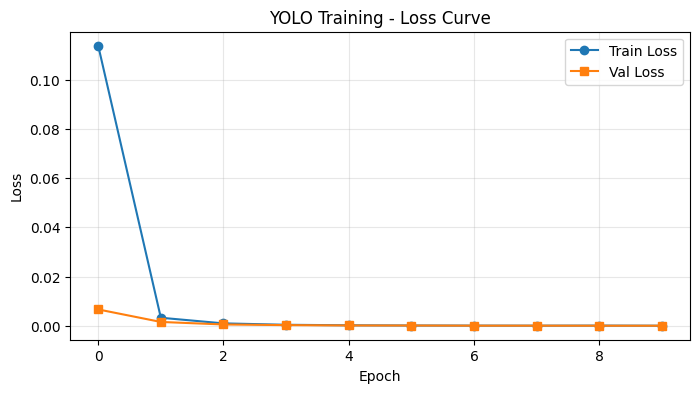

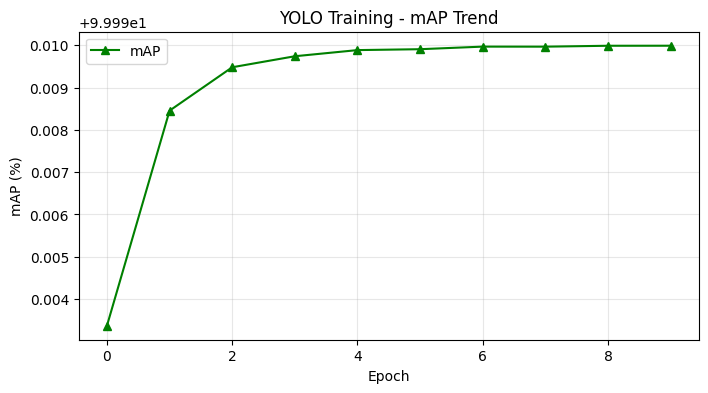

In [ ]:
# plot_yolo_training(train_losses, val_losses, ap_values)

In [ ]:
# # --- YOLO helpers: decode head -> boxes, then draw ---
# import torch, torchvision, cv2, numpy as np, matplotlib.pyplot as plt

# VOC_TINY_ANCHORS = [
#     [(10,13),(16,30),(33,23)],   # head @ 13x13 (stride 32)
#     [(30,61),(62,45),(59,119)]   # head @ 26x26 (stride 16)
# ]
# VOC_TINY_STRIDES = [32, 16]

# def decode_yolo_output(det, anchors, stride, num_classes, conf_thresh=0.35):
#     """
#     det: [B, A*(5+C), H, W] raw conv output (no activations applied)
#     returns per-batch lists of (boxes[N,4], scores[N], cls_ids[N]) in input-pixel scale
#     """
#     B, _, H, W = det.shape
#     A = len(anchors)

#     # [B, A, 5+C, H, W] -> [B, A, H, W, 5+C]
#     det = det.view(B, A, 5+num_classes, H, W).permute(0,1,3,4,2).contiguous()

#     # grid (H,W,2)
#     yy, xx = torch.meshgrid(torch.arange(H, device=det.device),
#                             torch.arange(W, device=det.device), indexing="ij")
#     grid = torch.stack((xx, yy), dim=-1)  # (H,W,2)

#     # anchors (A,1,1,2)
#     anc = torch.tensor(anchors, dtype=torch.float32, device=det.device).view(A,1,1,2)

#     out_boxes, out_scores, out_cls = [], [], []
#     for b in range(B):
#         d = det[b]  # [A,H,W,5+C]

#         tx = d[..., 0]; ty = d[..., 1]
#         tw = d[..., 2]; th = d[..., 3]
#         to = d[..., 4]
#         tc = d[..., 5:]  # [A,H,W,C]

#         # YOLO decode to input-pixel scale
#         cx = (torch.sigmoid(tx) + grid[..., 0]) * stride   # [A,H,W]
#         cy = (torch.sigmoid(ty) + grid[..., 1]) * stride
#         pw = torch.exp(tw) * anc[..., 0]                   # [A,H,W]
#         ph = torch.exp(th) * anc[..., 1]

#         # objectness * best class prob
#         obj = torch.sigmoid(to)
#         cls_scores = torch.sigmoid(tc)                     # [A,H,W,C]
#         cls_conf, cls_id = cls_scores.max(dim=-1)          # [A,H,W]
#         score = obj * cls_conf

#         mask = score > conf_thresh
#         if mask.sum() == 0:
#             out_boxes.append(torch.empty((0,4), device=det.device))
#             out_scores.append(torch.empty((0,), device=det.device))
#             out_cls.append(torch.empty((0,), dtype=torch.long, device=det.device))
#             continue

#         cx = cx[mask]; cy = cy[mask]; pw = pw[mask]; ph = ph[mask]
#         x1 = cx - pw/2; y1 = cy - ph/2; x2 = cx + pw/2; y2 = cy + ph/2
#         boxes = torch.stack([x1,y1,x2,y2], dim=1)

#         out_boxes.append(boxes)
#         out_scores.append(score[mask])
#         out_cls.append(cls_id[mask].long())

#     return out_boxes, out_scores, out_cls


# def draw_boxes(img_rgb01, boxes, scores, cls_ids, class_names, max_det_draw=50):
#     """
#     Draw bounding boxes + labels clearly on an RGB [0..1] image.
#     """
#     img = (img_rgb01 * 255).astype(np.uint8).copy()
#     N = min(len(boxes), max_det_draw)
#     if N == 0:
#         return img

#     for i in range(N):
#         x1, y1, x2, y2 = boxes[i].round().to(torch.int32).tolist()
#         x1 = max(0, x1); y1 = max(0, y1)
#         x2 = max(0, x2); y2 = max(0, y2)
#         color = (0, 255, 0)

#         # Draw rectangle
#         cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

#         # ---- Label text ----
#         cls_name = class_names[int(cls_ids[i])] if int(cls_ids[i]) < len(class_names) else str(int(cls_ids[i]))
#         score = float(scores[i])
#         label = f"{cls_name}: {score:.2f}"

#         # text size & background box
#         (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
#         th = int(th * 1.2)
#         cv2.rectangle(img, (x1, y1 - th - 4), (x1 + tw + 2, y1), color, -1)

#         # white text with black border for readability
#         cv2.putText(img, label, (x1 + 1, y1 - 6),
#                     cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 3, cv2.LINE_AA)
#         cv2.putText(img, label, (x1 + 1, y1 - 6),
#                     cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1, cv2.LINE_AA)
#     return img




# import torch, torchvision, cv2, numpy as np, matplotlib.pyplot as plt

# def show_yolo_predictions(model, dataloader, class_names, device,
#                           num_images=6, conf_thresh=0.5, nms_thresh=0.45,
#                           anchors=[[(10,13),(16,30),(33,23)], [(30,61),(62,45),(59,119)]],
#                           strides=[32,16], max_det=20):
#     """
#     Show YOLOv3-Tiny predictions with clean boxes + single label per detection.
#     """
#     model.eval()
#     shown = 0
#     cols = 3
#     rows = int(np.ceil(num_images / cols))
#     plt.figure(figsize=(5*cols, 5.5*rows))

#     with torch.no_grad():
#         for imgs, _ in dataloader:
#             imgs_t = torch.stack(imgs).to(device)
#             preds = model(imgs_t)
#             B = imgs_t.size(0)

#             for b in range(B):
#                 if shown >= num_images:
#                     plt.tight_layout(); plt.show(); return

#                 img_np = imgs_t[b].cpu().permute(1,2,0).numpy()
#                 img_np = np.clip(img_np, 0, 1)
#                 H_img, W_img = img_np.shape[:2]
#                 img_disp = (img_np*255).astype(np.uint8).copy()

#                 all_boxes, all_scores, all_cls = [], [], []

#                 # --- Decode each YOLO head ---
#                 for head_i, det in enumerate(preds):
#                     boxes_b, scores_b, cls_b = decode_yolo_output(
#                         det, anchors[head_i], strides[head_i], model.num_classes, conf_thresh
#                     )
#                     boxes_b, scores_b, cls_b = boxes_b[b], scores_b[b], cls_b[b]
#                     if len(boxes_b) == 0:
#                         continue
#                     keep = torchvision.ops.nms(boxes_b, scores_b, nms_thresh)
#                     all_boxes.append(boxes_b[keep])
#                     all_scores.append(scores_b[keep])
#                     all_cls.append(cls_b[keep])

#                 ax = plt.subplot(rows, cols, shown+1)
#                 ax.axis("off")

#                 if len(all_boxes) == 0:
#                     ax.imshow(img_np)
#                     ax.set_title("No detection", color="gray", fontsize=10)
#                     shown += 1
#                     continue

#                 boxes = torch.cat(all_boxes)
#                 scores = torch.cat(all_scores)
#                 cls_ids = torch.cat(all_cls)

#                 # Global NMS + keep top detections only
#                 keep = torchvision.ops.nms(boxes, scores, nms_thresh)
#                 boxes, scores, cls_ids = boxes[keep], scores[keep], cls_ids[keep]
#                 if len(boxes) > max_det:
#                     topk = torch.topk(scores, k=max_det).indices
#                     boxes, scores, cls_ids = boxes[topk], scores[topk], cls_ids[topk]

#                 # --- Draw final detections ---
#                 for (x1, y1, x2, y2), s, c in zip(boxes, scores, cls_ids):
#                     if s < conf_thresh:  # skip weak
#                         continue
#                     x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
#                     color = (0,255,0)
#                     cv2.rectangle(img_disp, (x1,y1), (x2,y2), color, 2)
#                     label = f"{class_names[int(c)]}: {s:.2f}"
#                     (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
#                     cv2.rectangle(img_disp, (x1, y1 - th - 4), (x1 + tw + 2, y1), color, -1)
#                     cv2.putText(img_disp, label, (x1+1, y1-6),
#                                 cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,0), 3, cv2.LINE_AA)
#                     cv2.putText(img_disp, label, (x1+1, y1-6),
#                                 cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 1, cv2.LINE_AA)

#                 ax.imshow(cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB))

#                 # --- Clean summary text below image ---
#                 top_labels = [f"{class_names[int(c)]} ({s:.2f})"
#                               for c, s in sorted(zip(cls_ids, scores),
#                                                  key=lambda x: float(x[1]), reverse=True)[:5]]
#                 ax.set_title("\n".join(top_labels), fontsize=9, color="green")
#                 shown += 1

#     plt.tight_layout(); plt.show()



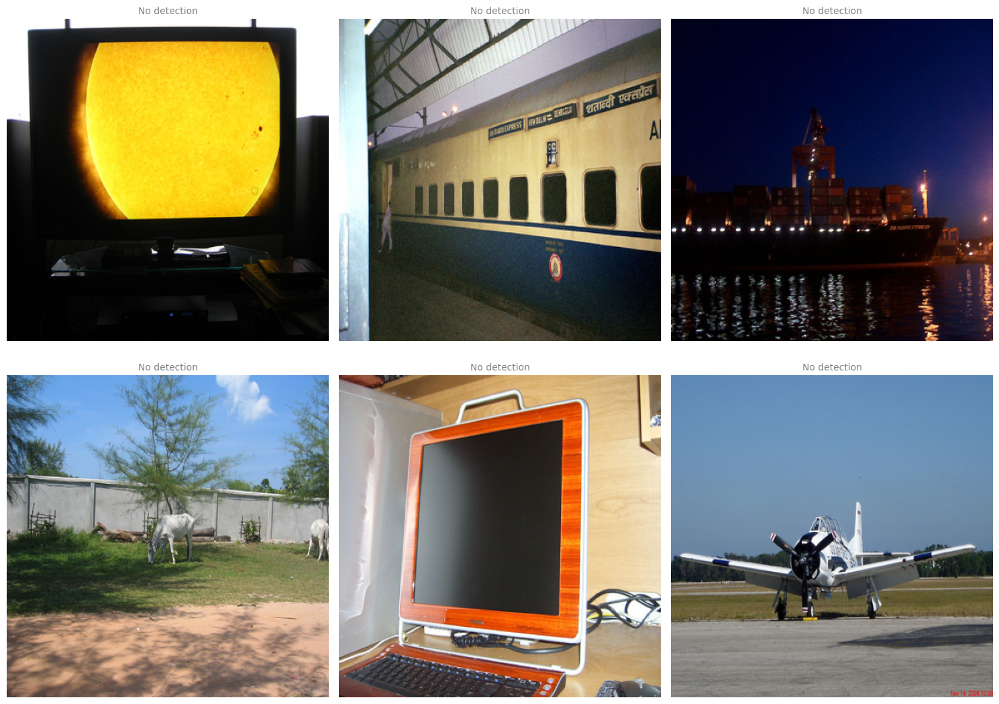

In [ ]:
# show_yolo_predictions(model, valloader, class_names=VOC_CLASSES, device=device, num_images=6)


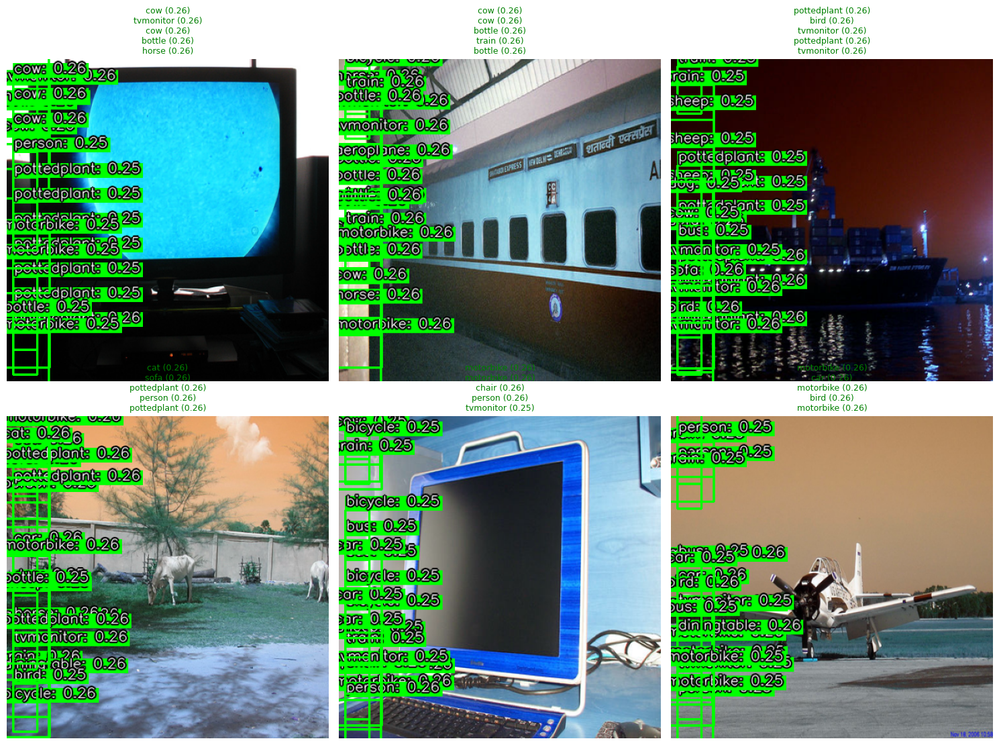

In [ ]:
# show_yolo_predictions(model, valloader, class_names=VOC_CLASSES,
#                       device=device, num_images=6, conf_thresh=0.25, nms_thresh=0.45)


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 23.2 MB/s eta 0:00:00


In [ ]:

# def save_model(model, name="model", folder="saved_models"):
#     os.makedirs(folder, exist_ok=True)
#     path = os.path.join(folder, f"{name}.pth")
#     torch.save(model.state_dict(), path)
#     print(f"✅ Model saved to {path}")

# def load_model(model_class, name="model", folder="saved_models", map_location=None):
#     path = os.path.join(folder, f"{name}.pth")
#     model = model_class()
#     model.load_state_dict(torch.load(path, map_location=map_location or device))
#     model.to(device)
#     print(f"✅ Model loaded from {path}")
#     return model

In [ ]:
import os, torch
from ultralytics import YOLO

def save_model(model, name="model", folder="saved_models"):
    """
    Save either a standard PyTorch model (state_dict) or an Ultralytics YOLO model (.pt)
    """
    os.makedirs(folder, exist_ok=True)
    path = os.path.join(folder, f"{name}.pt")

    if isinstance(model, YOLO):
        # ✅ Ultralytics YOLO model
        model.save(path)
        print(f"✅ Ultralytics YOLO model saved to {path}")
    else:
        # ✅ Regular PyTorch model
        torch.save(model.state_dict(), path)
        print(f"✅ PyTorch model saved to {path}")

    return path


def load_model(path, model_class=None, device=None):
    """
    Load a model from path — works for Ultralytics YOLO or PyTorch models.

    Args:
        path (str): Path to the saved .pt model
        model_class: (optional) PyTorch class for custom models (e.g., TinyYOLOv3)
        device: Torch device (default: auto-detect GPU)
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")

    # ✅ If it's an Ultralytics YOLO model
    if os.path.basename(path).startswith("yolo") or "runs/" in path:
        print(f"🔹 Loading Ultralytics YOLO model from {path}")
        model = YOLO(path)
        model.to(device)
        print("✅ YOLO model loaded successfully.")
        return model

    # ✅ Otherwise, assume a custom PyTorch model
    elif model_class is not None:
        print(f"🔹 Loading PyTorch model from {path}")
        model = model_class()
        model.load_state_dict(torch.load(path, map_location=device))
        model.to(device)
        print("✅ PyTorch model loaded successfully.")
        return model

    else:
        raise ValueError(
            "❌ model_class is required for loading custom PyTorch models (non-YOLO)."
        )


In [ ]:
# # def save_yolo_model(model,path="yolov3_custom_voc2012.pt"):
# #     torch.save(model.state_dict(),path); print(f"✅ Saved to {path}")
# # def load_yolo_model(model_class,path,num_classes,device):
# #     m=model_class(num_classes=num_classes)
# #     m.load_state_dict(torch.load(path,map_location=device))
# #     m.to(device).eval(); print(f"✅ Loaded from {path}"); return m

# save_model(model,name="yolov3_custom_voc2012.pt")


✅ Ultralytics YOLO model saved to saved_models/yolov3_custom_voc2012.pt.pt


'saved_models/yolov3_custom_voc2012.pt.pt'

In [ ]:
# ============================================================
# Step 1 — Convert Pascal VOC 2007 XML annotations to YOLO labels
# ============================================================

import os, xml.etree.ElementTree as ET, glob

# Pascal VOC 20 classes
VOC_CLASSES = [
    "aeroplane","bicycle","bird","boat","bottle",
    "bus","car","cat","chair","cow","diningtable",
    "dog","horse","motorbike","person","pottedplant",
    "sheep","sofa","train","tvmonitor"
]

def convert_box(size, box):
    """Convert (xmin,xmax,ymin,ymax) to normalized YOLO (x,y,w,h)."""
    dw, dh = 1.0 / size[0], 1.0 / size[1]
    x = (box[0] + box[1]) / 2.0 - 1
    y = (box[2] + box[3]) / 2.0 - 1
    w = box[1] - box[0]
    h = box[3] - box[2]
    return (x * dw, y * dh, w * dw, h * dh)

def convert_voc_to_yolo(voc_root, out_dir):
    ann_dir = os.path.join(voc_root, "Annotations")
    img_dir = os.path.join(voc_root, "JPEGImages")
    os.makedirs(out_dir, exist_ok=True)

    xml_files = sorted(glob.glob(os.path.join(ann_dir, "*.xml")))
    for xml_path in xml_files:
        tree = ET.parse(xml_path)
        root = tree.getroot()
        size = root.find("size")
        w = int(size.find("width").text)
        h = int(size.find("height").text)
        base = os.path.basename(xml_path).replace(".xml", "")
        out_path = os.path.join(out_dir, base + ".txt")
        with open(out_path, "w") as f:
            for obj in root.iter("object"):
                cls_name = obj.find("name").text
                if cls_name not in VOC_CLASSES:
                    continue
                cls_id = VOC_CLASSES.index(cls_name)
                xmlbox = obj.find("bndbox")
                b = (
                    float(xmlbox.find("xmin").text),
                    float(xmlbox.find("xmax").text),
                    float(xmlbox.find("ymin").text),
                    float(xmlbox.find("ymax").text),
                )
                bb = convert_box((w, h), b)
                f.write(f"{cls_id} {' '.join([f'{a:.6f}' for a in bb])}\n")

    print(f"✅ Converted {len(xml_files)} annotations to YOLO format at: {out_dir}")

# Example usage
convert_voc_to_yolo(
    voc_root="/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007",
    out_dir="/content/data/voc2007/labels"
)


✅ Converted 5011 annotations to YOLO format at: /content/data/voc2007/labels


In [ ]:

import shutil, random

def prepare_voc_split(voc_root, output_root="/content/data/voc2007_split", val_ratio=0.2, seed=42):
    random.seed(seed)
    img_dir = os.path.join(voc_root, "JPEGImages")
    label_dir = os.path.join("/content/data/voc2007/labels")

    img_paths = sorted(glob.glob(os.path.join(img_dir, "*.jpg")))
    random.shuffle(img_paths)
    n_val = int(len(img_paths) * val_ratio)
    train_imgs = img_paths[n_val:]
    val_imgs = img_paths[:n_val]

    def copy_split(img_list, split):
        out_img = os.path.join(output_root, "images", split)
        out_lbl = os.path.join(output_root, "labels", split)
        os.makedirs(out_img, exist_ok=True)
        os.makedirs(out_lbl, exist_ok=True)
        for img_path in img_list:
            base = os.path.basename(img_path)
            lbl_path = os.path.join(label_dir, base.replace(".jpg", ".txt"))
            shutil.copy(img_path, os.path.join(out_img, base))
            if os.path.exists(lbl_path):
                shutil.copy(lbl_path, os.path.join(out_lbl, os.path.basename(lbl_path)))

    copy_split(train_imgs, "train")
    copy_split(val_imgs, "val")

    print(f"✅ Dataset split complete: {len(train_imgs)} train, {len(val_imgs)} val.")


prepare_voc_split(
    voc_root="/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007",
    output_root="/content/data/voc2007_split",
    val_ratio=0.2
)


✅ Dataset split complete: 4009 train, 1002 val.


In [ ]:
from torch.utils.data import Dataset
import torch, cv2, numpy as np, os, glob

def letterbox_image(img, inp_dim):
    img_h, img_w = img.shape[:2]
    w, h = inp_dim
    scale = min(w/img_w, h/img_h)
    new_w, new_h = int(img_w*scale), int(img_h*scale)
    resized = cv2.resize(img, (new_w, new_h), interpolation=cv2.INTER_CUBIC)
    canvas = np.full((h, w, 3), 128, dtype=np.uint8)
    top, left = (h - new_h)//2, (w - new_w)//2
    canvas[top:top+new_h, left:left+new_w] = resized
    return canvas

def prep_image(img, inp_dim):
    img = letterbox_image(img, (inp_dim, inp_dim))
    img = img[:, :, ::-1].transpose(2, 0, 1).copy()
    img = torch.from_numpy(img).float().div(255.0)
    return img

class VOCDataset(Dataset):
    def __init__(self, img_dir, label_dir, inp_dim=416):
        self.img_files = sorted(glob.glob(os.path.join(img_dir, "*.jpg")))
        self.label_dir = label_dir
        self.inp_dim = inp_dim

    def __len__(self): return len(self.img_files)

    def __getitem__(self, idx):
        img_path = self.img_files[idx]
        label_path = os.path.join(
            self.label_dir, os.path.basename(img_path).replace(".jpg", ".txt")
        )

        img = cv2.imread(img_path)
        img_tensor = prep_image(img, self.inp_dim)
        targets = []
        if os.path.exists(label_path):
            with open(label_path) as f:
                for line in f.readlines():
                    cls, x, y, w, h = map(float, line.strip().split())
                    targets.append([cls, x, y, w, h])
        targets = torch.tensor(targets if targets else [[0, 0, 0, 0, 0]], dtype=torch.float32)
        return img_tensor, targets



In [ ]:
target_path = "yolo/darknet.py"
source_url = "https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/darknet.py"
download_file(target_path, source_url)


In [ ]:
target_path = "yolo/util.py"
source_url = "https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/util.py"
download_file(target_path, source_url)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# ----------------------------------------------------------
# Helper: Parse cfg file
# ----------------------------------------------------------
def parse_cfg(cfgfile):
    with open(cfgfile, "r") as f:
        lines = [l.strip() for l in f.readlines() if l.strip() and not l.startswith("#")]
    blocks, block = [], {}
    for line in lines:
        if line.startswith("["):
            if block:
                blocks.append(block)
                block = {}
            block["type"] = line.strip("[]")
        else:
            key, value = line.split("=")
            block[key.strip()] = value.strip()
    blocks.append(block)
    return blocks


# ----------------------------------------------------------
# Helper: Build modules from parsed cfg
# ----------------------------------------------------------
def create_modules(blocks):
    net_info = blocks[0]
    module_list = nn.ModuleList()
    prev_filters = 3
    output_filters = []

    for idx, block in enumerate(blocks[1:]):
        modules = nn.Sequential()

        if block["type"] == "convolutional":
            filters = int(block["filters"])
            size = int(block["size"])
            stride = int(block["stride"])
            pad = (size - 1) // 2 if int(block.get("pad", 0)) else 0
            activation = block["activation"]

            bn = int(block.get("batch_normalize", 0))
            conv = nn.Conv2d(prev_filters, filters, size, stride, pad, bias=not bn)
            modules.add_module(f"conv_{idx}", conv)
            if bn:
                modules.add_module(f"batch_norm_{idx}", nn.BatchNorm2d(filters))
            if activation == "leaky":
                modules.add_module(f"leaky_{idx}", nn.LeakyReLU(0.1, inplace=True))

        elif block["type"] == "upsample":
            stride = int(block["stride"])
            modules.add_module(f"upsample_{idx}", nn.Upsample(scale_factor=stride, mode="nearest"))

        elif block["type"] == "route":
            modules.add_module(f"route_{idx}", nn.Identity())

        elif block["type"] == "shortcut":
            modules.add_module(f"shortcut_{idx}", nn.Identity())

        elif block["type"] == "yolo":
            modules.add_module(f"yolo_{idx}", nn.Identity())

        module_list.append(modules)
        prev_filters = int(block.get("filters", prev_filters))
        output_filters.append(prev_filters)

    return net_info, module_list


# ----------------------------------------------------------
# Helper: Prediction transform (with shape check)
# ----------------------------------------------------------
def predict_transform(prediction, inp_dim, anchors, num_classes):
    B = prediction.size(0)
    C = prediction.size(1)
    grid_size = prediction.size(2)
    stride = inp_dim // grid_size
    bbox_attrs = 5 + num_classes
    num_anchors = len(anchors)

    expected_C = num_anchors * bbox_attrs
    if C != expected_C:
        raise RuntimeError(
            f"[predict_transform] channel mismatch: got {C}, expected {expected_C}. "
            f"Check cfg filters/classes and anchor masks."
        )

    prediction = prediction.view(B, num_anchors, bbox_attrs, grid_size, grid_size)
    prediction = prediction.permute(0, 1, 3, 4, 2).contiguous()
    prediction[..., 0:2] = torch.sigmoid(prediction[..., 0:2])  # x, y offsets
    prediction[..., 4:] = torch.sigmoid(prediction[..., 4:])    # conf + class
    return prediction.view(B, -1, bbox_attrs)


# ----------------------------------------------------------
# YOLOv3 Model with Mask Fix + Dynamic Input
# ----------------------------------------------------------
import torch
import torch.nn as nn
import torch.nn.functional as F

# ---- simplified YOLOv3 forward with mask fix ----
class YOLOv3(nn.Module):
    def __init__(self, cfgfile):
        super().__init__()
        from pathlib import Path
        assert Path(cfgfile).exists(), f"{cfgfile} not found"
        self.blocks = self.parse_cfg(cfgfile)
        self.net_info, self.module_list = self.create_modules(self.blocks)

    def parse_cfg(self, cfgfile):
        lines = [l.strip() for l in open(cfgfile) if l.strip() and not l.startswith("#")]
        blocks, block = [], {}
        for line in lines:
            if line.startswith("["):
                if block: blocks.append(block); block = {}
                block["type"] = line.strip("[]")
            else:
                k, v = line.split("=")
                block[k.strip()] = v.strip()
        blocks.append(block)
        return blocks

    def create_modules(self, blocks):
        module_list = nn.ModuleList()
        prev_filters = 3
        for i, block in enumerate(blocks[1:]):
            seq = nn.Sequential()
            if block["type"] == "convolutional":
                filters, size, stride = int(block["filters"]), int(block["size"]), int(block["stride"])
                pad = (size - 1) // 2 if int(block.get("pad", 0)) else 0
                conv = nn.Conv2d(prev_filters, filters, size, stride, pad,
                                 bias=not int(block.get("batch_normalize", 0)))
                seq.add_module(f"conv_{i}", conv)
                if "batch_normalize" in block:
                    seq.add_module(f"bn_{i}", nn.BatchNorm2d(filters))
                if block["activation"] == "leaky":
                    seq.add_module(f"leaky_{i}", nn.LeakyReLU(0.1, inplace=True))
                prev_filters = filters
            elif block["type"] == "upsample":
                seq.add_module(f"upsample_{i}", nn.Upsample(scale_factor=int(block["stride"]), mode="nearest"))
            else:
                seq.add_module(f"identity_{i}", nn.Identity())
            module_list.append(seq)
        return blocks[0], module_list

    def forward(self, x):
      outputs, detections = {}, []
      for i, block in enumerate(self.blocks[1:]):
          block_type = block["type"]

          if block_type in ["convolutional", "upsample"]:
              x = self.module_list[i](x)

          elif block_type == "route":
              layers = [int(l) for l in block["layers"].split(",")]
              layers = [l if l > 0 else i + l for l in layers]
              x = torch.cat([outputs[l] for l in layers], 1)

          elif block_type == "shortcut":
              from_ = int(block["from"])
              x = outputs[i - 1] + outputs[i + from_]

          elif block_type == "yolo":
              # Select anchors via mask, as shown before
              all_anchors = [int(a) for a in block["anchors"].split(",")]
              all_anchors = [(all_anchors[j], all_anchors[j+1]) for j in range(0, len(all_anchors), 2)]
              mask = [int(m) for m in block["mask"].split(",")]
              anchors = [all_anchors[m] for m in mask]

              num_classes = int(block["classes"])
              inp_dim = x.size(2)
              yolo_pred = predict_transform(x, inp_dim, anchors, num_classes)
              detections.append(yolo_pred)

          outputs[i] = x

      return torch.cat(detections, 1) if detections else None




In [ ]:
from torch.utils.data import DataLoader

train_ds = VOCDataset(
    img_dir="/content/data/voc2007_split/images/train",
    label_dir="/content/data/voc2007_split/labels/train"
)
val_ds = VOCDataset(
    img_dir="/content/data/voc2007_split/images/val",
    label_dir="/content/data/voc2007_split/labels/val"
)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=2)

print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))


Train batches: 502
Val batches: 126


In [ ]:
# ============================================================
# train_yolo.py — Training function (returns metrics only)
# ============================================================

import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# -------------------------------
# YOLOv3 Simplified Loss
# -------------------------------
class YoloLoss(nn.Module):
    def __init__(self, lambda_coord=5.0, lambda_noobj=0.5):
        super().__init__()
        self.mse = nn.MSELoss()
        self.bce = nn.BCELoss()
        self.lambda_coord = lambda_coord
        self.lambda_noobj = lambda_noobj

    def forward(self, preds, targets, num_classes):
        if preds is None or preds.numel() == 0:
            return torch.tensor(0.0, device=DEVICE)
        obj_mask = (targets[..., 1] > 0).float().unsqueeze(-1)
        loss_xy = self.mse(preds[..., 0:2]*obj_mask, targets[..., 1:3]*obj_mask)
        loss_wh = self.mse(preds[..., 2:4]*obj_mask, targets[..., 3:5]*obj_mask)
        loss_obj = self.bce(preds[..., 4], obj_mask.squeeze(-1))
        loss_noobj = self.bce(preds[..., 4]*(1-obj_mask.squeeze(-1)), torch.zeros_like(preds[..., 4]))
        cls_pred = preds[..., 5:5+num_classes]
        cls_target = F.one_hot(targets[..., 0].long(), num_classes).float()
        loss_cls = self.bce(cls_pred*obj_mask, cls_target*obj_mask)
        total = self.lambda_coord*(loss_xy + loss_wh) + loss_obj + self.lambda_noobj*loss_noobj + loss_cls
        return total


# -------------------------------
# Compute IoU
# -------------------------------
def bbox_iou(box1, box2):
    b1_x1, b1_y1, b1_x2, b1_y2 = box1
    b2_x1, b2_y1, b2_x2, b2_y2 = box2
    inter_x1, inter_y1 = max(b1_x1, b2_x1), max(b1_y1, b2_y1)
    inter_x2, inter_y2 = min(b1_x2, b2_x2), min(b1_y2, b2_y2)
    inter_area = max(0, inter_x2 - inter_x1 + 1) * max(0, inter_y2 - inter_y1 + 1)
    b1_area = (b1_x2 - b1_x1 + 1) * (b1_y2 - b1_y1 + 1)
    b2_area = (b2_x2 - b2_x1 + 1) * (b2_y2 - b2_y1 + 1)
    return inter_area / (b1_area + b2_area - inter_area + 1e-6)


# -------------------------------
# Compute mAP
# -------------------------------
def compute_mAP(pred_boxes, true_boxes, num_classes, iou_thres=0.5):
    APs = []
    for c in range(num_classes):
        preds_c = [b for b in pred_boxes if b[0] == c]
        gts_c = [b for b in true_boxes if b[0] == c]
        n_gt = len(gts_c)
        if n_gt == 0 or len(preds_c) == 0:
            continue
        preds_c.sort(key=lambda x: x[1], reverse=True)
        TP, FP = np.zeros(len(preds_c)), np.zeros(len(preds_c))
        detected = []
        for i, p in enumerate(preds_c):
            _, conf, x1, y1, x2, y2 = p
            ious = [bbox_iou((x1, y1, x2, y2), gt[1:]) for gt in gts_c]
            iou_max = max(ious) if ious else 0
            gt_idx = np.argmax(ious) if ious else -1
            if iou_max > iou_thres and gt_idx not in detected:
                TP[i] = 1; detected.append(gt_idx)
            else:
                FP[i] = 1
        TP_cum, FP_cum = np.cumsum(TP), np.cumsum(FP)
        recalls = TP_cum / n_gt
        precisions = TP_cum / np.maximum(TP_cum + FP_cum, np.finfo(np.float64).eps)
        AP = np.trapz(precisions, recalls)
        APs.append(AP)
    return np.mean(APs) if APs else 0.0


# -------------------------------
# Training Function (No plotting)
# -------------------------------
def train_yolo(model, train_loader, val_loader, num_classes=20, epochs=10, lr=1e-4):
    model.to(DEVICE)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    criterion = YoloLoss().to(DEVICE)

    train_losses, val_losses, mAP_scores = [], [], []

    for epoch in range(1, epochs + 1):
        model.train()
        train_loss_epoch = 0.0
        for imgs, targets_list in train_loader:
            imgs = imgs.to(DEVICE)

            targets = torch.cat(targets_list, dim=0).to(DEVICE)

            preds = model(imgs)
            if preds.numel() == 0:
                continue
            loss = criterion(preds, targets, num_classes)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_loss_epoch += loss.item()
        train_loss = train_loss_epoch / max(len(train_loader), 1)
        train_losses.append(train_loss)

        # Validation
        model.eval()
        val_loss_epoch = 0.0
        pred_boxes, true_boxes = [], []
        with torch.no_grad():
            for imgs, targets in tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]"):
                imgs, targets = imgs.to(DEVICE), targets.to(DEVICE)
                preds = model(imgs)
                if preds.numel() == 0:
                    continue
                val_loss_epoch += criterion(preds, targets, num_classes).item()
                for b in range(preds.size(0)):
                    conf = preds[b, :, 4].cpu().numpy()
                    boxes = preds[b, :, :4].cpu().numpy()
                    for j in range(len(conf)):
                        pred_boxes.append((0, conf[j], *boxes[j]))
                for t in targets.cpu().numpy():
                    true_boxes.append((int(t[0]), *t[1:5]))
        val_loss = val_loss_epoch / max(len(val_loader), 1)
        val_losses.append(val_loss)

        mAP = compute_mAP(pred_boxes, true_boxes, num_classes)
        mAP_scores.append(mAP)

        print(f"Epoch {epoch}: TrainLoss={train_loss:.4f}, ValLoss={val_loss:.4f}, mAP@0.5={mAP:.3f}")

    return train_losses, val_losses, mAP_scores


In [ ]:
raw_zip_dir = "yolo/cfg/yolov3.cfg"
source_url = "https://raw.githubusercontent.com/ayooshkathuria/YOLO_v3_tutorial_from_scratch/master/cfg/yolov3.cfg"
download_file(raw_zip_dir, source_url)

Download to yolo/cfg/yolov3.cfg...


In [ ]:
def yolo_collate_fn(batch):
    """
    Collate function to handle variable number of objects (targets).
    Keeps images stacked, targets as list of tensors.
    """
    imgs = [item[0] for item in batch]          # list of image tensors
    targets = [item[1] for item in batch]       # list of (N_i, 5) tensors
    imgs = torch.stack(imgs, dim=0)             # stack images into [B,3,H,W]
    return imgs, targets


In [ ]:
from torch.utils.data import DataLoader

train_ds = VOCDataset(
    img_dir="/content/data/voc2007_split/images/train",
    label_dir="/content/data/voc2007_split/labels/train"
)
val_ds = VOCDataset(
    img_dir="/content/data/voc2007_split/images/val",
    label_dir="/content/data/voc2007_split/labels/val"
)

train_loader = DataLoader(
    train_ds,
    batch_size=8,
    shuffle=True,
    num_workers=2,
    collate_fn=yolo_collate_fn
)

val_loader = DataLoader(
    val_ds,
    batch_size=8,
    shuffle=False,
    num_workers=2,
    collate_fn=yolo_collate_fn
)

print("Train batches:", len(train_loader))
print("Val batches:", len(val_loader))


Train batches: 502
Val batches: 126


In [ ]:
def check_yolo_cfg(cfg_path):
    """Show every conv→yolo pair and the current filters/classes."""
    conv_filters, yolo_classes = [], []
    with open(cfg_path) as f:
        lines = [l.strip() for l in f if l.strip()]
    for i, line in enumerate(lines):
        if line.lower() == "[yolo]":
            # find its conv block
            j = i - 1
            while j >= 0 and "[convolutional]" not in lines[j].lower():
                j -= 1
            # extract filters
            filt = None
            for k in range(j, i):
                if lines[k].startswith("filters="):
                    filt = int(lines[k].split("=")[1])
            # extract classes
            cls = None
            for k in range(i, len(lines)):
                if lines[k].startswith("classes="):
                    cls = int(lines[k].split("=")[1])
                    break
            conv_filters.append(filt)
            yolo_classes.append(cls)
    print("Detected YOLO heads:")
    for n,(filt,cls) in enumerate(zip(conv_filters,yolo_classes),1):
        print(f"  Head {n}: filters={filt}, classes={cls}")


In [ ]:
check_yolo_cfg("/content/yolo/cfg/yolov3.cfg")


Detected YOLO heads:
  Head 1: filters=255, classes=80
  Head 2: filters=255, classes=80
  Head 3: filters=255, classes=80


In [ ]:
def patch_yolov3_cfg(cfg_path, output_path="yolov3_voc.cfg", num_classes=20, num_anchors=3, names_path="voc.names", class_names=None):
    """
    Patch YOLOv3 config for a custom dataset.
    - Updates filters and classes for each YOLO head.
    - Optionally writes class names to a .names file.
    """
    with open(cfg_path, "r") as f:
        lines = f.readlines()

    patched = []
    for i, line in enumerate(lines):
        if line.strip().startswith("filters="):
            # Look ahead to see if next block is [yolo]
            if i + 1 < len(lines) and "[yolo]" in lines[i + 1]:
                new_filters = num_anchors * (num_classes + 5)
                patched.append(f"filters={new_filters}\n")
            else:
                patched.append(line)
        elif line.strip().startswith("classes="):
            patched.append(f"classes={num_classes}\n")
        else:
            patched.append(line)

    with open(output_path, "w") as f:
        f.writelines(patched)
    print(f"✅ Patched config saved to: {output_path}")

    # Write class names if provided
    if class_names:
        with open(names_path, "w") as f:
            for name in class_names:
                f.write(name + "\n")
        print(f"✅ Class names saved to: {names_path}")

patch_yolov3_cfg(cfg_path="/content/yolo/cfg/yolov3.cfg",output_path="/content/yolo/cfg/yolov3-voc.cfg")

✅ Patched config saved to: /content/yolo/cfg/yolov3-voc.cfg


In [ ]:
import sys
import os

yolo_path = os.path.abspath("yolo")
if yolo_path not in sys.path:
    sys.path.insert(0, yolo_path)

import darknet

base_dir = os.path.abspath(".")
print(base_dir)
cfg_path = os.path.join(base_dir, "yolo", "cfg", "yolov3-.cfg")


blocks = darknet.parse_cfg(cfg_path)


print(darknet.create_modules(blocks))

In [ ]:
check_yolo_cfg("/content/yolo/cfg/yolov3-voc.cfg")


Detected YOLO heads:
  Head 1: filters=75, classes=20
  Head 2: filters=75, classes=20
  Head 3: filters=75, classes=20


In [ ]:
import urllib.request, re, os


def create_full_yolov3_cfg_voc(save_path="/content/yolo/cfg/yolov3-voc.cfg",
                               num_classes=20,
                               width=416,
                               height=416):
    """
    Download the complete 106-layer YOLOv3.cfg from the official Darknet repo
    and patch only the three YOLO heads for Pascal VOC (classes=20, filters=75).
    """
    url = "https://raw.githubusercontent.com/pjreddie/darknet/master/cfg/yolov3.cfg"
    print("⬇️  Downloading official YOLOv3.cfg ...")
    cfg_lines = urllib.request.urlopen(url).read().decode("utf-8").splitlines()

    filters_val = 3 * (5 + num_classes)
    new_lines = []
    for i, line in enumerate(cfg_lines):
        s = line.strip()
        # Update network width/height
        if s.startswith("width="):
            line = f"width={width}"
        if s.startswith("height="):
            line = f"height={height}"
        # Patch filters before YOLO heads
        if re.match(r"^filters=", s):
            if "[yolo]" in "\n".join(cfg_lines[i+1:i+6]).lower():
                line = f"filters={filters_val}"
        # Patch classes inside YOLO blocks
        if re.match(r"^classes=", s):
            line = f"classes={num_classes}"
        new_lines.append(line)

    os.makedirs(os.path.dirname(save_path), exist_ok=True)
    with open(save_path, "w") as f:
        f.write("\n".join(new_lines))

    print(f"✅ Full YOLOv3-VOC cfg written → {save_path}")
    print(f"   classes={num_classes}, filters={filters_val}")
    return save_path

cfg_path = create_yolov3_cfg_voc()


✅ Clean YOLOv3-VOC cfg written → /content/yolo/cfg/yolov3-voc.cfg
   classes=20, filters=75


In [ ]:
voc_cfg = create_yolov3_cfg("/content/yolo/cfg/yolov3-voc.cfg", num_classes=20)

✅ YOLOv3 config generated and saved to: /content/yolo/cfg/yolov3-voc.cfg
   → classes=20, filters=75
   → input=416x416, max_batches=4000


In [ ]:
!grep -n "filters=" /content/yolo/cfg/yolov3-voc.cfg | grep 75


75:filters=64
603:filters=75
689:filters=75
753:filters=256
758:filters=128
776:filters=75


In [ ]:
!grep -n "filters=" /content/yolo/cfg/yolov3-voc.cfg


27:filters=32
37:filters=64
45:filters=32
53:filters=64
67:filters=128
75:filters=64
83:filters=128
95:filters=64
103:filters=128
117:filters=256
125:filters=128
133:filters=256
145:filters=128
153:filters=256
165:filters=128
173:filters=256
185:filters=128
193:filters=256
206:filters=128
214:filters=256
226:filters=128
234:filters=256
246:filters=128
254:filters=256
266:filters=128
274:filters=256
288:filters=512
296:filters=256
304:filters=512
317:filters=256
325:filters=512
338:filters=256
346:filters=512
359:filters=256
367:filters=512
379:filters=256
387:filters=512
400:filters=256
408:filters=512
421:filters=256
429:filters=512
441:filters=256
449:filters=512
463:filters=1024
471:filters=512
479:filters=1024
491:filters=512
499:filters=1024
511:filters=512
519:filters=1024
531:filters=512
539:filters=1024
553:filters=512
564:filters=1024
569:filters=512
580:filters=1024
585:filters=512
596:filters=1024
603:filters=75
623:filters=256
639:filters=256
650:filters=512
655:filters=256

In [ ]:
!wc -l /content/yolo/cfg/yolov3-voc.cfg


788 /content/yolo/cfg/yolov3-voc.cfg


In [ ]:
# install once
# !git clone https://github.com/eriklindernoren/PyTorch-YOLOv3.git /content/yolov3_ref


Cloning into '/content/yolov3_ref'...
remote: Enumerating objects: 2013, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 2013 (delta 19), reused 3 (delta 3), pack-reused 1981 (from 2)
Receiving objects: 100% (2013/2013), 16.73 MiB | 21.69 MiB/s, done.
Resolving deltas: 100% (1203/1203), done.


In [ ]:
# import sys, torch, re, os
# sys.path.append("/content/yolov3_ref")
# # from models import Darknet

# # --- use your existing voc cfg, or re-create it quickly ---
# base = "/content/yolov3_ref/config/yolov3.cfg"
# voc_cfg = "/content/yolo/cfg/yolov3-voc.cfg"
# lines = open(base).read().splitlines()
# filters_val = 3*(5+20)
# patched=[]
# for i,l in enumerate(lines):
#     s=l.strip()
#     if s.startswith("filters=") and "[yolo]" in "\n".join(lines[i+1:i+6]).lower():
#         l=f"filters={filters_val}"
#     if s.startswith("classes="): l="classes=20"
#     patched.append(l)
# os.makedirs(os.path.dirname(voc_cfg), exist_ok=True)
# open(voc_cfg,"w").write("\n".join(patched))
# print("✅ VOC cfg ready:", voc_cfg)


✅ VOC cfg ready: /content/yolo/cfg/yolov3-voc.cfg


In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
model = YOLOv3("/content/yolo/cfg/yolov3-voc.cfg").to(DEVICE)


In [ ]:
old_model=darknet.YOLOv3("/content/yolo/cfg/yolov3.cfg").to(DEVICE)

In [ ]:
# for i,b in enumerate(model.blocks[1:20]):   # first 20 layers
#     print(i, b["type"], b.get("filters"))

for i,b in enumerate(model.blocks):   # first 20 layers
    print(i, b["type"], b.get("filters"))


0 convolutional 32
1 convolutional 64
2 convolutional 32
3 convolutional 64
4 shortcut None
5 convolutional 128
6 convolutional 64
7 convolutional 128
8 shortcut None
9 convolutional 64
10 convolutional 128
11 shortcut None
12 convolutional 256
13 convolutional 128
14 convolutional 256
15 shortcut None
16 convolutional 128
17 convolutional 256
18 shortcut None


In [ ]:
for i,b in enumerate(old_model.blocks):   # first 20 layers
    print(i, b["type"], b.get("filters"))

In [ ]:
!tree f -L 2 /content/yolov3_ref

f  [error opening dir]
/content/yolov3_ref
├── assets
│   ├── dog.png
│   ├── giraffe.png
│   ├── messi.png
│   └── traffic.png
├── config
│   ├── coco.data
│   ├── create_custom_model.sh
│   ├── custom.data
│   ├── yolov3.cfg
│   └── yolov3-tiny.cfg
├── data
│   ├── coco.names
│   ├── custom
│   ├── get_coco_dataset.sh
│   └── samples
├── LICENSE
├── poetry.lock
├── pyproject.toml
├── pytorchyolo
│   ├── detect.py
│   ├── __init__.py
│   ├── models.py
│   ├── test.py
│   ├── train.py
│   └── utils
├── README.md
└── weights
    └── download_weights.sh

8 directories, 21 files


In [ ]:
!pip install imgaug

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 25.0 MB/s eta 0:00:00


In [ ]:
from pytorchyolo.models import Darknet


model = Darknet(voc_cfg).to(DEVICE)
x = torch.randn(1,3,416,416).to(DEVICE)
with torch.no_grad():
    outs = model(x)
print("✅ Forward OK")
for o in outs:
    print(o.shape)



AttributeError: `np.sctypes` was removed in the NumPy 2.0 release. Access dtypes explicitly instead.

In [ ]:
def check_head_filters(cfg):
    with open(cfg) as f:
        lines=[l.strip() for l in f if l.strip()]
    heads=[]
    for i,l in enumerate(lines):
        if l.lower()=="[yolo]":
            j=i-1
            while j>0 and not lines[j].startswith("filters="):
                j-=1
            heads.append(lines[j])
    print("Head filters:",heads)

check_head_filters("/content/yolo/cfg/yolov3-voc.cfg")


Head filters: ['filters=75', 'filters=75', 'filters=75']


In [ ]:
# ============================================================
# Step: Clear GPU memory safely before training
# ============================================================

import torch, gc

def clear_cuda():
    """
    Safely clears GPU memory cache and unused tensors.
    Call this before creating model or starting training.
    """
    print("🧹 Clearing CUDA memory ...")
    gc.collect()                      # clear Python garbage
    torch.cuda.empty_cache()          # clear PyTorch cache
    if torch.cuda.is_available():
        with torch.cuda.device("cuda"):
            torch.cuda.reset_peak_memory_stats()
    print("✅ CUDA memory cleared.\n")

clear_cuda()


🧹 Clearing CUDA memory ...
✅ CUDA memory cleared.



In [ ]:
voc_cfg = create_yolov3_cfg_voc(
    save_path="/content/yolo/cfg/yolov3-voc.cfg",
    num_classes=20,
    width=416,
    height=416
)
model = YOLOv3(voc_cfg).to(DEVICE)


⬇️  Downloading base YOLOv3 configuration ...
✅ YOLOv3-VOC config written → /content/yolo/cfg/yolov3-voc.cfg
   classes=20, filters=75, input=416×416


In [ ]:

# model = YOLOv3("/content/yolo/cfg/yolov3-voc.cfg").to(DEVICE)


train_losses, val_losses, mAP_scores = train_yolo(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_classes=20,
    epochs=20,
    lr=1e-4
)


RuntimeError: Given groups=1, weight of size [256, 75, 1, 1], expected input[8, 512, 13, 13] to have 75 channels, but got 512 channels instead

## Exercise 2 ultralytic

In [ ]:
from ultralytics import YOLO
import os, yaml
import matplotlib.pyplot as plt

In [ ]:
!apt-get install tree
!tree -f -L 3 /content/DLCV_Lab_Dataset/

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
/content/DLCV_Lab_Dataset
├── /content/DLCV_Lab_Dataset/raw_zips
│   └── /content/DLCV_Lab_Dataset/raw_zips/pascal-voc-2012-dataset.zip
├── /content/DLCV_Lab_Dataset/VOC2012_test
│   └── /content/DLCV_Lab_Dataset/VOC2012_test/VOC2012_test
│       ├── /content/DLCV_Lab_Dataset/VOC2012_test/VOC2012_test/Annotations
│       ├── /content/DLCV_Lab_Dataset/VOC2012_test/VOC2012_test/ImageSets
│       └── /content/DLCV_Lab_Dataset/VOC2012_test/VOC2012_test/JPEGImages
└── /content/DLCV_Lab_Dataset/VOC2012_train_val
    └── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val
        ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/Annotations
        ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/devkit_doc.pdf
        ├── /content/DLCV_Lab_Datase

In [ ]:
!tree -f -L 2 /content/DLCV_Lab_Dataset/VOC2012_train_val

/content/DLCV_Lab_Dataset/VOC2012_train_val
└── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val
    ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/Annotations
    ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/devkit_doc.pdf
    ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/ImageSets
    ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/JPEGImages
    ├── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/SegmentationClass
    └── /content/DLCV_Lab_Dataset/VOC2012_train_val/VOC2012_train_val/SegmentationObject

6 directories, 1 file


In [ ]:
import os
from pathlib import Path

# Source Pascal VOC 2007 roots
trainval_root = "/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007"
test_root = "/content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007"

# Output root for YOLOv11 dataset
yolo_root = "/content/DLCV_Lab_Dataset/VOC2007_yolo"
Path(yolo_root).mkdir(parents=True, exist_ok=True)
print(f"✅ YOLO output directory: {yolo_root}")


✅ YOLO output directory: /content/DLCV_Lab_Dataset/VOC2007_yolo


In [ ]:
VOC_CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow", "diningtable",
    "dog", "horse", "motorbike", "person", "pottedplant",
    "sheep", "sofa", "train", "tvmonitor"
]
CLASS_TO_ID = {cls: i for i, cls in enumerate(VOC_CLASSES)}


In [ ]:
def read_split_list(voc_root, split_name):
    path = os.path.join(voc_root, "ImageSets/Main", f"{split_name}.txt")
    with open(path, "r") as f:
        ids = [x.strip() for x in f.readlines() if x.strip()]
    return ids

train_ids = read_split_list(trainval_root, "train")
val_ids = read_split_list(trainval_root, "val")

print(f"📊 Found {len(train_ids)} train and {len(val_ids)} val IDs")


📊 Found 2501 train and 2510 val IDs


In [ ]:
for split in ["train", "val", "test"]:
    for sub in ["images", "labels"]:
        Path(os.path.join(yolo_root, sub, split)).mkdir(parents=True, exist_ok=True)
print("📁 Created YOLO folder structure.")


📁 Created YOLO folder structure.


In [ ]:
import xml.etree.ElementTree as ET
import shutil
from tqdm import tqdm

def voc_to_yolo(xml_path, txt_path, class_map):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    w = int(root.find("size/width").text)
    h = int(root.find("size/height").text)
    lines = []
    for obj in root.findall("object"):
        cls_name = obj.find("name").text
        if cls_name not in class_map:
            continue
        cls_id = class_map[cls_name]
        box = obj.find("bndbox")
        xmin = float(box.find("xmin").text)
        ymin = float(box.find("ymin").text)
        xmax = float(box.find("xmax").text)
        ymax = float(box.find("ymax").text)
        x_center = ((xmin + xmax) / 2.0) / w
        y_center = ((ymin + ymax) / 2.0) / h
        width = (xmax - xmin) / w
        height = (ymax - ymin) / h
        lines.append(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    if lines:
        with open(txt_path, "w") as f:
            f.write("\n".join(lines))


In [ ]:
def process_split(ids, split_name, voc_root, yolo_root):
    img_src = os.path.join(voc_root, "JPEGImages")
    xml_src = os.path.join(voc_root, "Annotations")
    img_dst = os.path.join(yolo_root, "images", split_name)
    lbl_dst = os.path.join(yolo_root, "labels", split_name)

    for img_id in tqdm(ids, desc=f"Processing {split_name}"):
        src_img = os.path.join(img_src, img_id + ".jpg")
        src_xml = os.path.join(xml_src, img_id + ".xml")
        dst_img = os.path.join(img_dst, img_id + ".jpg")
        dst_lbl = os.path.join(lbl_dst, img_id + ".txt")

        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        if os.path.exists(src_xml):
            voc_to_yolo(src_xml, dst_lbl, CLASS_TO_ID)


In [ ]:
process_split(train_ids, "train", trainval_root, yolo_root)
process_split(val_ids, "val", trainval_root, yolo_root)


Processing val: 100%|██████████| 2510/2510 [00:05<00:00, 428.33it/s] 


In [ ]:
def process_test(voc_root, yolo_root):
    img_src = os.path.join(voc_root, "JPEGImages")
    xml_src = os.path.join(voc_root, "Annotations")
    img_dst = os.path.join(yolo_root, "images", "test")
    lbl_dst = os.path.join(yolo_root, "labels", "test")

    for xml in tqdm(os.listdir(xml_src), desc="Processing test"):
        if not xml.endswith(".xml"):
            continue
        img_id = os.path.splitext(xml)[0]
        src_img = os.path.join(img_src, img_id + ".jpg")
        src_xml = os.path.join(xml_src, xml)
        dst_img = os.path.join(img_dst, img_id + ".jpg")
        dst_lbl = os.path.join(lbl_dst, img_id + ".txt")
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        voc_to_yolo(src_xml, dst_lbl, CLASS_TO_ID)

process_test(test_root, yolo_root)
print("✅ Test set processed and converted.")


Processing test: 100%|██████████| 4952/4952 [00:02<00:00, 2391.26it/s]

✅ Test set processed and converted.


In [ ]:
for split in ["train", "val", "test"]:
    imgs = len(os.listdir(os.path.join(yolo_root, "images", split)))
    lbls = len(os.listdir(os.path.join(yolo_root, "labels", split)))
    print(f"{split.upper():<5}: {imgs:>5} images, {lbls:>5} labels")


TRAIN:  2501 images,  2501 labels
VAL  :  2510 images,  2510 labels
TEST :  4952 images,  4952 labels


In [ ]:
import yaml

yaml_dict = {
    "train": os.path.join(yolo_root, "images/train"),
    "val": os.path.join(yolo_root, "images/val"),
    "test": os.path.join(yolo_root, "images/test"),
    "nc": len(VOC_CLASSES),
    "names": VOC_CLASSES
}

yaml_path = os.path.join(yolo_root, "voc2007.yaml")
with open(yaml_path, "w") as f:
    yaml.dump(yaml_dict, f)
print(f"✅ Dataset YAML created at: {yaml_path}")


✅ Dataset YAML created at: /content/DLCV_Lab_Dataset/VOC2007_yolo/voc2007.yaml


In [ ]:
for split in ["train", "val", "test"]:
    imgs = len(os.listdir(os.path.join(yolo_root, "images", split)))
    lbls = len(os.listdir(os.path.join(yolo_root, "labels", split)))
    print(f"{split.upper():<5}: {imgs:>5} images, {lbls:>5} labels")


TRAIN:  2501 images,  2501 labels
VAL  :  2510 images,  2510 labels
TEST :  4952 images,  4952 labels


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 35.7 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")  # or yolo11n-seg.pt if segmentation
model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    device=0 if torch.cuda.is_available() else 'cpu'
)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/DLCV_Lab_Dataset/VOC2007_yolo/voc2007.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=Fal

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7c211bd7c6b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043

In [ ]:
import matplotlib.pyplot as plt
from pathlib import Path

def plot_yolo_training_curves(run_dir):
    """
    Plot YOLO training losses and AP curves from results.csv or results.png.
    """
    run_dir = Path(run_dir)
    results_csv = run_dir / "results.csv"
    results_png = run_dir / "results.png"

    # YOLO already generates results.png automatically
    if results_png.exists():
        from IPython.display import Image
        display(Image(filename=results_png, width=800))
        print("✅ Displayed Ultralytics built-in training summary.")
    elif results_csv.exists():
        import pandas as pd
        df = pd.read_csv(results_csv)
        # Plot Loss curves
        plt.figure(figsize=(8,5))
        plt.plot(df["train/box_loss"], label="Box Loss")
        plt.plot(df["train/cls_loss"], label="Cls Loss")
        plt.plot(df["val/box_loss"], label="Val Box Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Training and Validation Loss")
        plt.legend()
        plt.show()

        # Plot mAP
        plt.figure(figsize=(8,5))
        plt.plot(df["metrics/mAP50"], label="mAP@0.5")
        plt.plot(df["metrics/mAP50-95"], label="mAP@0.5:0.95")
        plt.xlabel("Epoch")
        plt.ylabel("mAP")
        plt.title("Mean Average Precision (Validation)")
        plt.legend()
        plt.show()
    else:
        print("⚠️ No results.csv or results.png found in", run_dir)


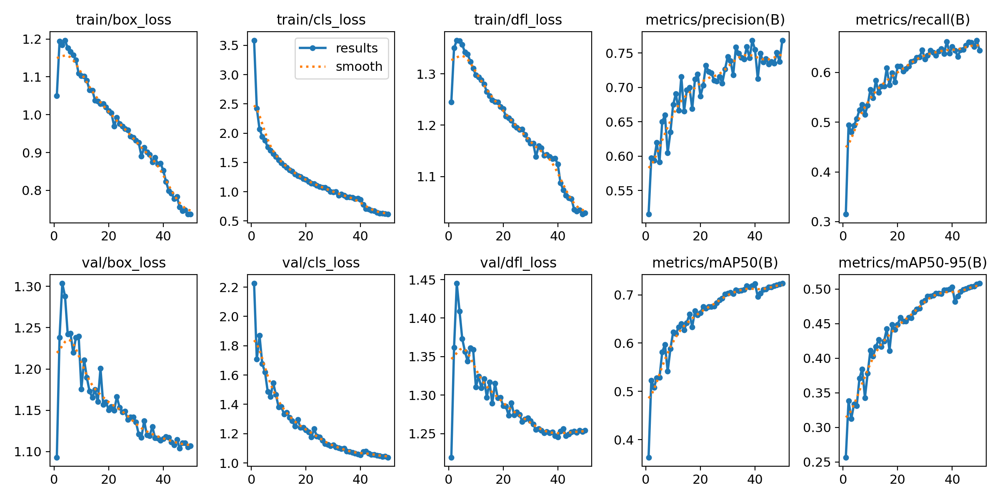

✅ Displayed Ultralytics built-in training summary.


In [ ]:
plot_yolo_training_curves("/content/runs/detect/train")


In [ ]:
save_model(model, name="voc2007_yolov11n", folder="saved_models")

✅ Ultralytics YOLO model saved to saved_models/voc2007_yolov11n.pt


'saved_models/voc2007_yolov11n.pt'

In [ ]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from ultralytics import YOLO

def plot_yolo_test_predictions(model_path, test_dir, conf=0.25, num_images=5, save_dir="/content/yolo_test_results"):
    """
    Run inference on a few test images and display annotated predictions inline.

    Args:
        model_path (str): Path to trained YOLO model (e.g., best.pt)
        test_dir (str): Path to test image directory
        conf (float): Confidence threshold for predictions
        num_images (int): Number of random test images to visualize
        save_dir (str): Directory where annotated images will be saved
    """
    import random
    model = YOLO(model_path)
    test_dir = Path(test_dir)

    # Pick random sample images
    imgs = sorted(test_dir.glob("*.jpg"))
    if len(imgs) == 0:
        raise FileNotFoundError(f"No test images found in {test_dir}")
    sample_imgs = random.sample(imgs, min(num_images, len(imgs)))

    # Run predictions
    results = model.predict(source=sample_imgs, conf=conf, save=True, project=save_dir)
    print(f"✅ Predictions saved at: {results[0].save_dir}")

    # Display inline
    fig, axes = plt.subplots(1, len(sample_imgs), figsize=(20, 6))
    if len(sample_imgs) == 1:
        axes = [axes]
    for ax, img_path in zip(axes, sample_imgs):
        out_path = Path(results[0].save_dir) / img_path.name
        img = cv2.cvtColor(cv2.imread(str(out_path)), cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(img_path.name)
        ax.axis("off")
    plt.show()



0: 640x640 1 bicycle, 1 motorbike, 1 person, 12.8ms
1: 640x640 2 trains, 12.8ms
2: 640x640 1 chair, 1 sofa, 12.8ms
3: 640x640 2 bicycles, 2 persons, 12.8ms
Speed: 3.9ms preprocess, 12.8ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/yolo_test_results/predict
✅ Predictions saved at: /content/yolo_test_results/predict


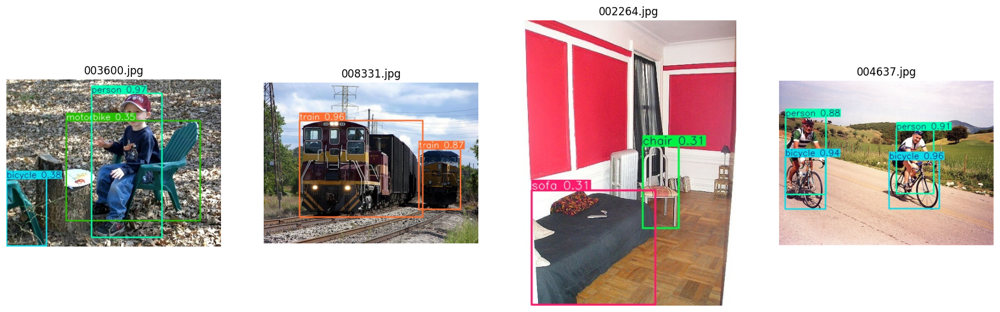

In [ ]:
plot_yolo_test_predictions(
    # model_path="/content/yolo_results/voc2012_dynamic/weights/best.pt",
    model_path="/content/saved_models/voc2007_yolov11n.pt",
    test_dir="/content/DLCV_Lab_Dataset/VOC2007_yolo/images/test",
    conf=0.25,
    num_images=4
)


In [ ]:
# evaluate_ultra_yolo(model, yaml_path)
metrics = model.val()
print(metrics)


Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,586,052 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2338.6±517.8 MB/s, size: 106.1 KB)
val: Scanning /content/DLCV_Lab_Dataset/VOC2007_yolo/labels/val.cache... 2510 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2510/2510 4.6Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 157/157 6.5it/s 24.1s
                   all       2510       7818      0.768      0.644      0.724      0.508
             aeroplane        127        175      0.821      0.789      0.859      0.609
               bicycle        133        216      0.769      0.664      0.758      0.548
                  bird        151        305       0.77      0.518      0.614      0.387
                  boat        101        190      0.729      0.489      0.593      0.355
                bott

In [ ]:
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2
import numpy as np
import os

def test_ultra_yolo(model, img_paths, device="cuda", conf=0.25, num_images=6, cols=3):
    """
    Test YOLO (Ultralytics) model on multiple images and plot predictions.

    Args:
        model: YOLO model (from ultralytics import YOLO)
        img_paths: list of image paths or a directory
        device: 'cuda', 'cpu', or int (e.g. 0)
        conf: confidence threshold (float)
        num_images: number of images to display
        cols: number of columns in the subplot grid
    """
    # Resolve device automatically
    if isinstance(device, str):
        if device == "cuda" and not torch.cuda.is_available():
            print("⚠️ CUDA not available, switching to CPU.")
            device = "cpu"

    # handle single path / folder / list
    if isinstance(img_paths, str) and os.path.isdir(img_paths):
        all_imgs = [os.path.join(img_paths, f) for f in os.listdir(img_paths)
                    if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    elif isinstance(img_paths, (list, tuple)):
        all_imgs = img_paths
    else:
        all_imgs = [img_paths]

    imgs_to_show = all_imgs[:num_images]

    # run inference
    results = model.predict(source=imgs_to_show, conf=conf, device=device, verbose=False)

    # plotting grid
    rows = int(np.ceil(len(imgs_to_show) / cols))
    plt.figure(figsize=(5*cols, 5*rows))

    for i, r in enumerate(results):
        annotated = r.plot()  # YOLO built-in visualization (with labels)
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(annotated)
        ax.axis("off")

        # summary text
        if len(r.boxes) > 0:
            labels_conf = [
                f"{r.names[int(c)]} ({float(s):.2f})"
                for c, s in zip(r.boxes.cls, r.boxes.conf)
            ]
            summary = "\n".join(labels_conf[:5])
            ax.set_title(summary, fontsize=9, color="green")
        else:
            ax.set_title("No detection", color="gray", fontsize=9)

    plt.tight_layout()
    plt.show()

    return results


In [ ]:
import pandas as pd

def plot_ultra_yolo_loss(results_dir="runs/detect/train_run"):
    """
    Plot Ultralytics YOLO training loss curves from results.csv
    """
    csv_path = os.path.join(results_dir, "results.csv")
    if not os.path.exists(csv_path):
        print("⚠️ results.csv not found — check your YOLO training run folder.")
        return

    df = pd.read_csv(csv_path)
    plt.figure(figsize=(8,5))
    plt.plot(df["epoch"], df["train/box_loss"], label="Box Loss")
    plt.plot(df["epoch"], df["train/cls_loss"], label="Class Loss")
    plt.plot(df["epoch"], df["train/dfl_loss"], label="DFL Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Ultralytics YOLO Training Losses")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


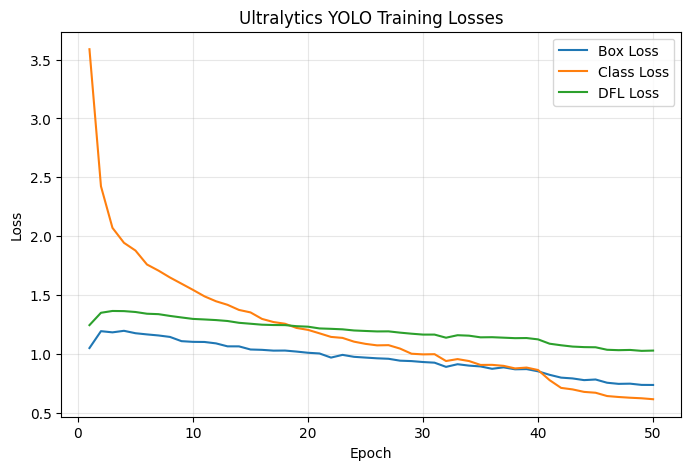

In [ ]:
plot_ultra_yolo_loss("/content/runs/detect/train")


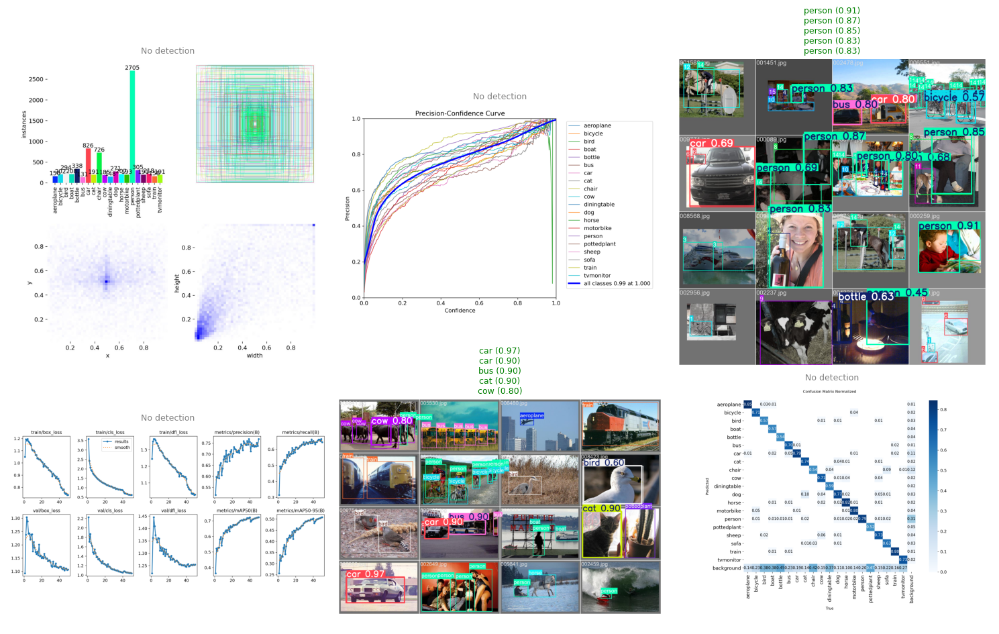

In [ ]:
results = test_ultra_yolo(model, "/content/runs/detect/train", device="cuda", conf=0.4, num_images=6)


In [ ]:
# results = test_ultra_yolo(model, "data/test.jpg", device="cuda", conf=0.4)


## Exercise 3 Ultratytic with Body part dataset:

In [ ]:
raw_zip_dir = "DLCV_Lab_Dataset/raw_zips/body-parts-dataset.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/linkanjarad/body-parts-dataset"
download_big_file(raw_zip_dir, source_url)

body-parts-dataset.zip: 100%|██████████| 6.56M/6.56M [00:01<00:00, 4.67MB/s]


In [ ]:
zip_path = "DLCV_Lab_Dataset/raw_zips/body-parts-dataset.zip"
extract_path = "DLCV_Lab_Dataset"
unzip_folder(zip_path, extract_path,sub_dir="body-parts-dataset")

📦 Extracting body-parts-dataset.zip → DLCV_Lab_Dataset


Extracting: 100%|██████████| 2092/2092 [00:00<00:00, 9338.85file/s]


In [ ]:
!rm -rf /content/data/body_parts_split

In [ ]:
import os, random, shutil

def prepare_classification_split(src_dir, dest_dir="/content/data/body_parts_split", val_ratio=0.2, test_ratio=0.1):
    """
    Split a classification dataset into train, val, and test sets.
    Each class folder is split proportionally.

    Args:
        src_dir (str): Source directory containing class folders (e.g., belly/, ears/, etc.)
        dest_dir (str): Destination root for split dataset
        val_ratio (float): Fraction of images to use for validation
        test_ratio (float): Fraction of images to use for testing
    Returns:
        (train_dir, val_dir, test_dir)
    """
    assert val_ratio + test_ratio < 1.0, "val_ratio + test_ratio must be < 1"

    classes = [c for c in os.listdir(src_dir) if os.path.isdir(os.path.join(src_dir, c))]
    os.makedirs(dest_dir, exist_ok=True)

    train_dir = os.path.join(dest_dir, "train")
    val_dir = os.path.join(dest_dir, "val")
    test_dir = os.path.join(dest_dir, "test")

    # Create directories
    for d in [train_dir, val_dir, test_dir]:
        for c in classes:
            os.makedirs(os.path.join(d, c), exist_ok=True)

    # Split and copy files
    for c in classes:
        class_path = os.path.join(src_dir, c)
        imgs = [f for f in os.listdir(class_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
        random.shuffle(imgs)

        n_total = len(imgs)
        n_val = int(n_total * val_ratio)
        n_test = int(n_total * test_ratio)
        n_train = n_total - n_val - n_test

        val_imgs = imgs[:n_val]
        test_imgs = imgs[n_val:n_val+n_test]
        train_imgs = imgs[n_val+n_test:]

        for img_list, out_dir in zip([train_imgs, val_imgs, test_imgs], [train_dir, val_dir, test_dir]):
            for img in img_list:
                src_path = os.path.join(class_path, img)
                dst_path = os.path.join(out_dir, c, img)
                shutil.copy(src_path, dst_path)

        print(f"📂 {c}: {n_train} train, {n_val} val, {n_test} test")

    print(f"\n✅ Split complete!")
    print(f"Train: {train_dir}\nVal:   {val_dir}\nTest:  {test_dir}")
    return train_dir, val_dir, test_dir





In [ ]:
src_dir = "/content/DLCV_Lab_Dataset/Body Parts Dataset"
train_dir, val_dir, test_dir = prepare_classification_split(src_dir)

📂 Belly: 147 train, 41 val, 20 test
📂 Neck: 145 train, 41 val, 20 test
📂 Eye: 151 train, 43 val, 21 test
📂 Nose: 147 train, 41 val, 20 test
📂 Hand: 153 train, 43 val, 21 test
📂 Foot: 147 train, 42 val, 21 test
📂 Elbow: 145 train, 41 val, 20 test
📂 Ear: 145 train, 41 val, 20 test
📂 Shoulders: 147 train, 42 val, 21 test
📂 Knee: 145 train, 41 val, 20 test

✅ Split complete!
Train: /content/data/body_parts_split/train
Val:   /content/data/body_parts_split/val
Test:  /content/data/body_parts_split/test


In [ ]:
print(train_dir)
print(val_dir)

/content/data/body_parts_split/train
/content/data/body_parts_split/val


## For Ultralytic Yolo classification model

In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n-cls.pt")  # you can also try yolov8m-cls.pt or yolov9e-cls.pt

root_dir = "/content/data/body_parts_split"
model.train(
    data=root_dir,    # folder with subfolders as class names
    epochs=30,
    imgsz=224,         # image size
    batch=16,
    lr0=0.001,
    project="YOLO_BodyParts",
    name="cls_train_run",
    device=0 if torch.cuda.is_available() else "cpu"
)


Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/body_parts_split, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=cls_train_run3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78761ddf3800>
curves: []
curves_results: []
fitness: 0.8737980723381042
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.7788461446762085, 'metrics/accuracy_top5': 0.96875, 'fitness': 0.8737980723381042}
save_dir: PosixPath('/content/YOLO_BodyParts/cls_train_run3')
speed: {'preprocess': 0.2038148654019796, 'inference': 1.0071467812534907, 'loss': 0.0003009447219972991, 'postprocess': 0.00041418509401689965}
task: 'classify'
top1: 0.7788461446762085
top5: 0.96875

In [ ]:
metrics = model.val()
print(metrics)


Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-cls summary (fused): 30 layers, 1,447,690 parameters, 0 gradients, 3.3 GFLOPs
train: /content/data/body_parts_split/train... found 1472 images in 10 classes ✅ 
val: /content/data/body_parts_split/val... found 416 images in 10 classes ✅ 
test: /content/data/body_parts_split/test... found 204 images in 10 classes ✅ 
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 188.9±90.3 MB/s, size: 3.0 KB)
val: Scanning /content/data/body_parts_split/val... 416 images, 0 corrupt: 100% ━━━━━━━━━━━━ 416/416 926.1Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 26/26 22.2it/s 1.2s
                   all      0.779      0.966
Speed: 0.2ms preprocess, 1.3ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val2
ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0

In [ ]:
results = model.predict(source="/content/DLCV_Lab_Dataset/Body Parts Dataset/Ear/Ear_1.jpg", show=True)


WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


image 1/1 /content/DLCV_Lab_Dataset/Body Parts Dataset/Ear/Ear_1.jpg: 224x224 Ear 1.00, Belly 0.00, Eye 0.00, Nose 0.00, Neck 0.00, 2.3ms
Speed: 2.8ms preprocess, 2.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_ultra_yolo_cls_loss(results_dir="runs/classify/cls_train_run"):
    csv_path = os.path.join(results_dir, "results.csv")
    if not os.path.exists(csv_path):
        print("⚠️ results.csv not found — check your run folder.")
        return

    df = pd.read_csv(csv_path)
    plt.figure(figsize=(8,5))
    plt.plot(df["epoch"], df["train/loss"], label="Train Loss", marker='o')
    plt.plot(df["epoch"], df["val/loss"], label="Val Loss", marker='s')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLO Classification Loss")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show()

plot_ultra_yolo_cls_loss("runs/classify/cls_train_run")


⚠️ results.csv not found — check your run folder.


In [ ]:
import os
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO

def test_yolo_classification_model(model, test_dir, num_images=9, conf=0.25, device="cuda"):
    """
    Evaluate and visualize YOLO classification model on a test set.

    Args:
        model: Trained YOLO classification model (YOLO object)
        test_dir (str): Path to test dataset folder
        num_images (int): Number of sample images to visualize
        conf (float): Confidence threshold for predictions
        device (str): 'cuda' or 'cpu'
    """
    # Run validation/testing
    print(f"🚀 Running test on: {test_dir}")
    metrics = model.val(data=test_dir, device=device, split="test", conf=conf)
    print("✅ Evaluation complete.")
    print(metrics.results_dict)

    # Collect test image paths
    img_paths = []
    for root, _, files in os.walk(test_dir):
        for f in files:
            if f.lower().endswith((".jpg", ".jpeg", ".png")):
                img_paths.append(os.path.join(root, f))
    img_paths = sorted(img_paths)

    if len(img_paths) == 0:
        print("⚠️ No images found in test directory.")
        return

    # Run predictions
    results = model.predict(source=img_paths[:num_images], conf=conf, device=device, verbose=False)

    # Plot results
    cols = 3
    rows = int((num_images + cols - 1) / cols)
    plt.figure(figsize=(5 * cols, 5 * rows))

    for i, (path, res) in enumerate(zip(img_paths[:num_images], results)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        pred_id = int(res.probs.top1)
        pred_label = res.names[pred_id]
        conf_score = float(res.probs.top1conf)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"#{i+1}\n{pred_label} ({conf_score:.2f})", color="green")

    plt.tight_layout()
    plt.show()


🚀 Running test on: /content/data/body_parts_split/test
Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
WARNING ⚠️ Dataset 'split=train' not found at /content/data/body_parts_split/test/train
Found 204 images in subdirectories. Attempting to split...
Splitting /content/data/body_parts_split/test (10 classes, 204 images) into 80% train, 20% val...
Split complete in /content/data/body_parts_split/test_split ✅
WARNING ⚠️ Dataset 'split=test' not found, using 'split=val' instead.
train: /content/data/body_parts_split/test_split/train... found 160 images in 10 classes ✅ 
val: /content/data/body_parts_split/test_split/val... found 44 images in 10 classes ✅ 
test: /content/data/body_parts_split/test_split/val... found 44 images in 10 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.0 ms, read: 73.2±34.2 MB/s, size: 3.3 KB)
test: Scanning /content/data/body_parts_split/test_split/val... 44 images, 0 corrupt: 100% ━━━━━━━━━━━━ 44/44 4.5Kit/s 0.0s
test: New cac

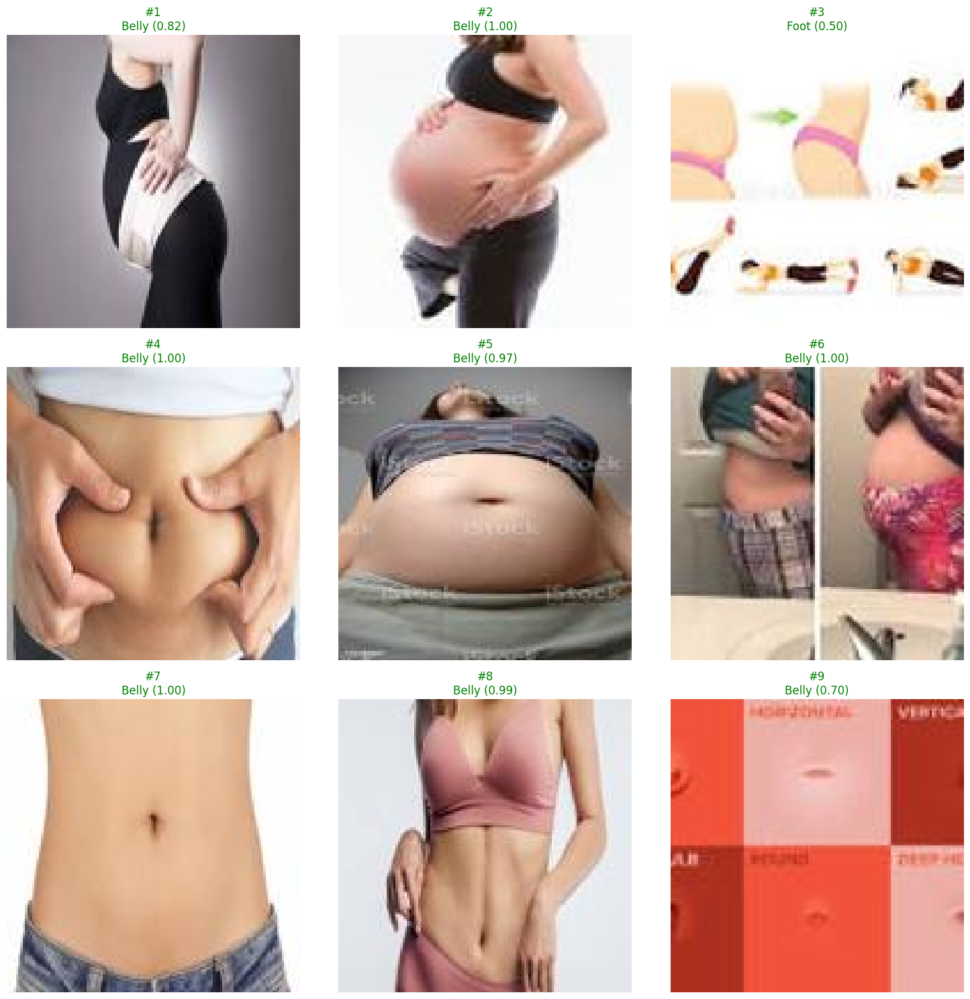

In [ ]:
from ultralytics import YOLO

# Load your trained YOLOv8 classification model
# model = YOLO("runs/classify/train/weights/best.pt")

# Path to test set (created by prepare_classification_split)
test_dir = "/content/data/body_parts_split/test"

# Evaluate and show predictions
test_yolo_classification_model(model, test_dir, num_images=9)


In [ ]:
save_model(name="ultra_yolo_cls", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_cls.pt


'saved_models/ultra_yolo_cls.pt'

## For Ultralytic Yolo detection model

In [ ]:
from ultralytics import YOLO

# Load detection model (not classification)
model = YOLO("yolov8n.pt")  # or yolov8s.pt for higher accuracy


In [ ]:
# !rm -rf /content/data/body_parts_split

In [ ]:
import cv2, numpy as np
from tqdm import tqdm

def generate_pseudo_yolo_labels(root_dir, out_root="body_parts_yolo"):
    """
    Generate YOLO-style pseudo bounding boxes from a folder-based classification dataset.
    One bounding box per image (based on largest contour).
    """
    for split in ["train", "val", "test"]:
        img_split = os.path.join(root_dir, split)
        out_img_dir = os.path.join(out_root, "images", split)
        out_lbl_dir = os.path.join(out_root, "labels", split)
        os.makedirs(out_img_dir, exist_ok=True)
        os.makedirs(out_lbl_dir, exist_ok=True)

        class_names = sorted(os.listdir(img_split))
        class_to_id = {c: i for i, c in enumerate(class_names)}

        for cls in class_names:
            class_dir = os.path.join(img_split, cls)
            imgs = [f for f in os.listdir(class_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

            for f in tqdm(imgs, desc=f"{split}/{cls}"):
                img_path = os.path.join(class_dir, f)
                img = cv2.imread(img_path)
                if img is None:
                    continue

                H, W = img.shape[:2]
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray, (5, 5), 0)
                _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

                contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                if not contours:
                    x, y, w, h = 0, 0, W, H
                else:
                    x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))

                x_center, y_center = (x + w/2)/W, (y + h/2)/H
                w_norm, h_norm = w/W, h/H

                label_path = os.path.join(out_lbl_dir, f.rsplit('.', 1)[0] + ".txt")
                cls_id = class_to_id[cls]
                with open(label_path, "w") as lf:
                    lf.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}\n")

                cv2.imwrite(os.path.join(out_img_dir, f), img)

    print(f"✅ YOLO pseudo-labels generated at: {out_root}")
    return out_root


In [ ]:
pseudo_root = generate_pseudo_yolo_labels("/content/data/body_parts_split")


test/Shoulders: 100%|██████████| 21/21 [00:00<00:00, 1619.69it/s]

✅ YOLO pseudo-labels generated at: body_parts_yolo


In [ ]:
import os, yaml

def create_yolo_yaml(out_root, class_names):
    out_root = os.path.abspath(out_root)  # 👈 make it absolute
    yaml_dict = {
        "train": os.path.join(out_root, "images/train"),
        "val": os.path.join(out_root, "images/val"),
        "test": os.path.join(out_root, "images/test"),
        "nc": len(class_names),
        "names": class_names
    }
    yaml_path = os.path.join(out_root, "body_parts.yaml")
    with open(yaml_path, "w") as f:
        yaml.dump(yaml_dict, f)
    print(f"✅ YAML created at: {yaml_path}")
    return yaml_path



✅ YAML created at: body_parts_yolo/body_parts.yaml


In [ ]:
class_names = sorted(os.listdir("/content/data/body_parts_split/train"))
yaml_path = create_yolo_yaml("/content/body_parts_yolo", class_names)


✅ YAML created at: /content/body_parts_yolo/body_parts.yaml


In [ ]:
!cat /content/body_parts_yolo/body_parts.yaml

names:
- Belly
- Ear
- Elbow
- Eye
- Foot
- Hand
- Knee
- Neck
- Nose
- Shoulders
nc: 10
test: /content/body_parts_yolo/images/test
train: /content/body_parts_yolo/images/train
val: /content/body_parts_yolo/images/val


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
results = model.train(data=yaml_path, epochs=30, imgsz=416, batch=8)


Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/body_parts_yolo/body_parts.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_yolo_training_metrics(results_csv_path):
    """
    Plot YOLO training metrics (losses and mAP) from results.csv.
    Works with YOLOv8/v9/v12 detection logs.

    Args:
        results_csv_path (str): Path to YOLO training results.csv file
    """
    if not os.path.exists(results_csv_path):
        print(f"❌ File not found: {results_csv_path}")
        return

    # Load the CSV
    df = pd.read_csv(results_csv_path)
    epochs = df["epoch"]

    # Create plots
    plt.figure(figsize=(14, 6))

    # ---- 1️⃣ Loss Curves ----
    plt.subplot(1, 2, 1)
    if "train/box_loss" in df.columns:
        plt.plot(epochs, df["train/box_loss"], label="Box Loss")
    if "train/cls_loss" in df.columns:
        plt.plot(epochs, df["train/cls_loss"], label="Class Loss")
    if "train/dfl_loss" in df.columns:
        plt.plot(epochs, df["train/dfl_loss"], label="DFL Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLO Training Loss Curves")
    plt.legend()
    plt.grid(True)

    # ---- 2️⃣ mAP Curves ----
    plt.subplot(1, 2, 2)
    if "metrics/mAP50(B)" in df.columns:
        plt.plot(epochs, df["metrics/mAP50(B)"], label="mAP@0.5")
    if "metrics/mAP50-95(B)" in df.columns:
        plt.plot(epochs, df["metrics/mAP50-95(B)"], label="mAP@0.5:0.95")
    plt.xlabel("Epoch")
    plt.ylabel("mAP")
    plt.title("YOLO Mean Average Precision")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


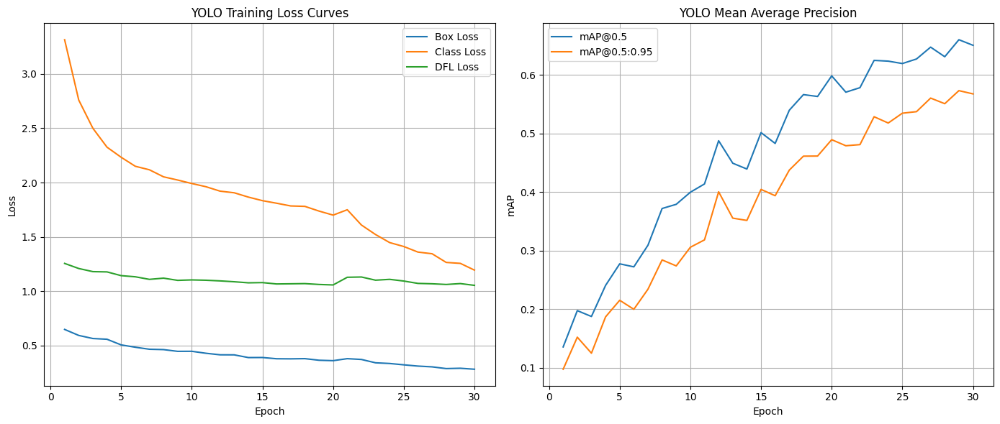

In [ ]:
# Path to YOLO training log (generated automatically after training)
csv_path = "runs/detect/train2/results.csv"  # adjust if you named your run differently

plot_yolo_training_metrics(csv_path)


In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_random_yolo_detections(model, img_dir, num_images=5, conf=0.25, device="cuda", save_dir=None):
    """
    Test YOLO detection model on random images and show bounding boxes.

    Args:
        model: YOLO detection model (e.g. YOLO("yolov8n.pt") or trained model)
        img_dir (str): Path to image directory (test folder)
        num_images (int): Number of random images to visualize
        conf (float): Confidence threshold
        device (str): 'cuda' or 'cpu'
        save_dir (str): Optional directory to save predictions
    """
    # Collect all image paths
    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    if len(img_paths) == 0:
        print(f"⚠️ No images found in: {img_dir}")
        return

    # Pick random images
    selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))

    # Run YOLO predictions
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=bool(save_dir),
        project=save_dir if save_dir else None,
        verbose=False
    )

    # Display results
    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Draw boxes manually for better notebook display
        for box in res.boxes:
            xyxy = box.xyxy[0].cpu().numpy()
            conf_score = float(box.conf)
            cls_id = int(box.cls)
            label = f"{res.names[cls_id]} {conf_score:.2f}"

            x1, y1, x2, y2 = map(int, xyxy)
            color = (0, 255, 0)
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, label, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(os.path.basename(path))

    plt.tight_layout()
    plt.show()


In [ ]:
save_model(name="ultra_yolo_det", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_det.pt


'saved_models/ultra_yolo_det.pt'

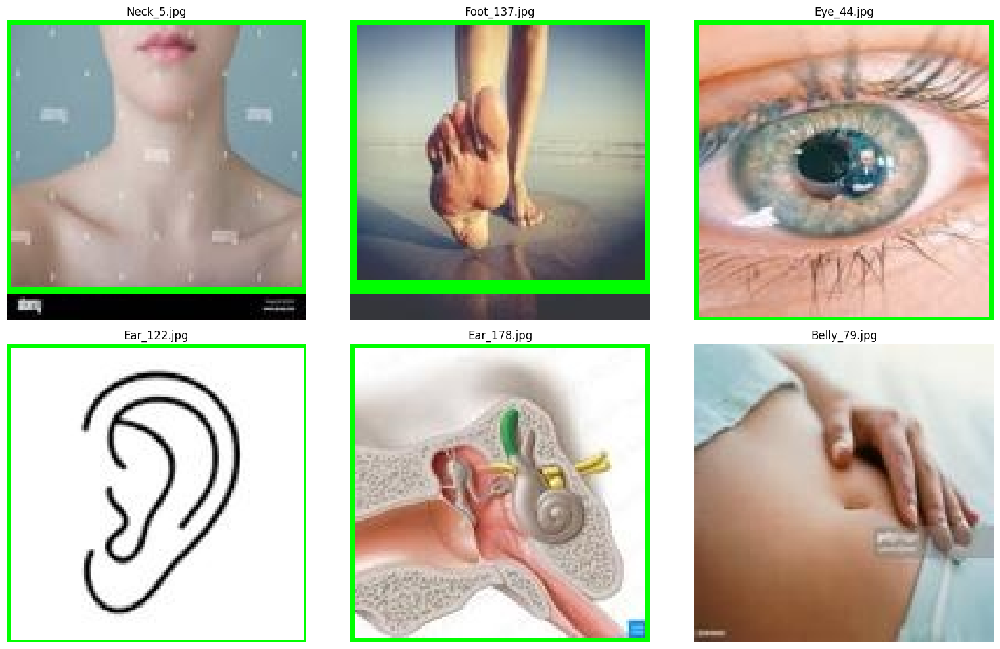

In [ ]:
from ultralytics import YOLO

# Load your trained model
# model = YOLO("runs/detect/train/weights/best.pt")
model=YOLO("saved_models/ultra_yolo_det.pt")

# Path to your test images
test_img_dir = "/content/body_parts_yolo/images/test"

# Show random predictions with bounding boxes
test_random_yolo_detections(model, test_img_dir, num_images=6, conf=0.3)


## For Ultralytic Yolo SEG model

In [ ]:
import cv2, numpy as np
from tqdm import tqdm

def generate_pseudo_segmentation_masks(root_dir, out_root="/content/body_parts_seg"):
    for split in ["train","val","test"]:
        src_split = os.path.join(root_dir, split)
        out_img_dir = os.path.join(out_root, "images", split)
        out_mask_dir = os.path.join(out_root, "masks", split)
        os.makedirs(out_img_dir, exist_ok=True)
        os.makedirs(out_mask_dir, exist_ok=True)

        class_names = sorted(os.listdir(src_split))
        class_to_id = {c:i for i,c in enumerate(class_names)}

        for cls in class_names:
            class_dir = os.path.join(src_split, cls)
            imgs = [f for f in os.listdir(class_dir) if f.lower().endswith((".jpg",".png",".jpeg"))]
            for f in tqdm(imgs, desc=f"{split}/{cls}"):
                img_path = os.path.join(class_dir, f)
                img = cv2.imread(img_path)
                if img is None: continue
                H, W = img.shape[:2]

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray,(5,5),0)
                _,th = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
                mask = cv2.bitwise_not(th)

                # Save mask
                mask_path = os.path.join(out_mask_dir, f)
                cv2.imwrite(mask_path, mask)
                # Copy image
                cv2.imwrite(os.path.join(out_img_dir, f), img)

    print(f"✅ Masks generated in {out_root}")
    return out_root


In [ ]:
root_dir="/content/data/body_parts_split"
seg_root = generate_pseudo_segmentation_masks(root_dir)


test/Shoulders: 100%|██████████| 21/21 [00:00<00:00, 1745.06it/s]

✅ Masks generated in /content/body_parts_seg


In [ ]:
print(seg_root)

/content/body_parts_seg


In [ ]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def create_yolo_segmentation_labels(seg_root, class_to_id=None, min_area=50):
    """
    Convert segmentation masks (.png, .jpg, .jpeg) to YOLO segmentation polygon labels (.txt)
    for all splits (train, val, test).

    Args:
        seg_root (str): Root folder containing 'masks/' and 'images/'.
        class_to_id (dict): Optional {class_name: id} mapping. If None, all = 0.
        min_area (int): Minimum contour area (ignore tiny noise).
    """
    splits = ["train", "val", "test"]
    mask_root = os.path.join(seg_root, "masks")
    label_root = os.path.join(seg_root, "labels")
    os.makedirs(label_root, exist_ok=True)

    total_converted = 0

    for split in splits:
        mask_dir = os.path.join(mask_root, split)
        if not os.path.exists(mask_dir):
            print(f"⚠️ Skipping '{split}' — no mask directory found: {mask_dir}")
            continue

        # ✅ include .jpg, .jpeg, .png
        mask_files = [
            f for f in os.listdir(mask_dir)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        if len(mask_files) == 0:
            print(f"⚠️ No mask files found in {mask_dir}")
            continue

        lbl_dir = os.path.join(label_root, split)
        os.makedirs(lbl_dir, exist_ok=True)

        for f in tqdm(mask_files, desc=f"Converting masks ({split})"):
            mask_path = os.path.join(mask_dir, f)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None:
                print(f"⚠️ Could not read mask: {mask_path}")
                continue

            H, W = mask.shape
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            label_path = os.path.join(lbl_dir, f.rsplit('.', 1)[0] + ".txt")

            with open(label_path, "w") as lf:
                valid_contours = 0
                for cnt in contours:
                    if cv2.contourArea(cnt) < min_area:
                        continue
                    valid_contours += 1
                    cnt = cnt.squeeze()
                    if len(cnt.shape) != 2:
                        continue
                    # Normalize coordinates
                    norm = []
                    for x, y in cnt:
                        norm.append(x / W)
                        norm.append(y / H)
                    cls_id = 0 if class_to_id is None else list(class_to_id.values())[0]
                    lf.write(f"{cls_id} " + " ".join(f"{n:.6f}" for n in norm) + "\n")

            total_converted += valid_contours

        print(f"✅ {split}: {len(mask_files)} masks processed")

    print(f"\n🎯 Conversion complete! Total polygons written: {total_converted}")



In [ ]:
create_yolo_segmentation_labels(seg_root)

Converting masks (train): 100%|██████████| 1472/1472 [00:03<00:00, 459.49it/s]


✅ train: 1472 masks processed


Converting masks (val): 100%|██████████| 416/416 [00:00<00:00, 449.29it/s]


✅ val: 416 masks processed


Converting masks (test): 100%|██████████| 204/204 [00:00<00:00, 450.91it/s]

✅ test: 204 masks processed

🎯 Conversion complete! Total polygons written: 4089


In [ ]:
import yaml, os

def create_seg_yaml(seg_root, class_names):
    yaml_dict = {
        "train": os.path.join(seg_root,"images/train"),
        "val": os.path.join(seg_root,"images/val"),
        "test": os.path.join(seg_root,"images/test"),
        "nc": len(class_names),
        "names": class_names
    }
    yaml_path = os.path.join(seg_root,"body_parts_seg.yaml")
    with open(yaml_path,"w") as f: yaml.dump(yaml_dict,f)
    print(f"✅ YAML saved at: {yaml_path}")
    return yaml_path

classes = sorted(os.listdir("/content/DLCV_Lab_Dataset/Body Parts Dataset"))
yaml_path = create_seg_yaml(seg_root, classes)


✅ YAML saved at: /content/body_parts_seg/body_parts_seg.yaml


In [ ]:
flush_yolo_cache(seg_root)

🗑️ Removed cache: /content/body_parts_seg/labels/val.cache
🗑️ Removed cache: /content/body_parts_seg/labels/train.cache
✅ Flushed 2 YOLO cache file(s).


In [ ]:
import os

seg_root = "/content/body_parts_seg"  # or your dataset root

for split in ["train", "val", "test"]:
    lbl_dir = os.path.join(seg_root, "labels", split)
    imgs = os.listdir(os.path.join(seg_root, "images", split))
    lbls = os.listdir(lbl_dir) if os.path.exists(lbl_dir) else []
    print(f"{split}: {len(imgs)} images, {len(lbls)} labels")


train: 1472 images, 1472 labels
val: 416 images, 416 labels
test: 204 images, 204 labels


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n-seg.pt")
results = model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=8
)


Ultralytics 8.3.223 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/body_parts_seg/body_parts_seg.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, pl

Traceback (most recent call last):
  File "/usr/lib/python3.12/multiprocessing/queues.py", line 259, in _feed
    reader_close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 178, in close
    self._close()
  File "/usr/lib/python3.12/multiprocessing/connection.py", line 377, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


train: Scanning /content/body_parts_seg/labels/train... 1472 images, 1 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 1472/1472 1.3Kit/s 1.1s
train: New cache created: /content/body_parts_seg/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 57.9±26.2 MB/s, size: 4.0 KB)
val: Scanning /content/body_parts_seg/labels/val... 416 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 416/416 556.1it/s 0.7s
val: New cache created: /content/body_parts_seg/labels/val.cache
Plotting labels to /content/runs/segment/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 66 weight(decay=0.0), 77 w

In [ ]:
# Path to YOLO training log (generated automatically after training)
csv_path = "runs/detect/train4/results.csv"  # adjust if you named your run differently

plot_yolo_training_metrics(csv_path)

❌ File not found: runs/detect/train4/results.csv


In [ ]:
save_model(name="ultra_yolo_seg", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_seg.pt


'saved_models/ultra_yolo_seg.pt'

In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_random_segmentation_predictions(model, img_dir, num_images=6, conf=0.25, device="cuda"):
    """
    Test YOLO segmentation model on random images and visualize masks + boxes + labels
    with dynamically scaled font size and thickness.
    """
    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
    if not img_paths:
        print(f"❌ No images found in {img_dir}")
        return

    selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=False,
        verbose=False
    )

    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]

        # Dynamically adjust label size
        base_thickness = max(1, int(min(W, H) / 500))      # e.g., 1–5 px
        base_font_scale = min(W, H) / 800.0                # e.g., 0.4–1.5
        base_font_scale = max(0.4, min(base_font_scale, 1.2))

        if hasattr(res, "masks") and res.masks is not None:
            for mask, box, cls_id, conf_score in zip(
                res.masks.data, res.boxes.xyxy, res.boxes.cls, res.boxes.conf
            ):
                # Resize mask to image size
                mask = mask.cpu().numpy()
                mask_resized = cv2.resize(mask, (W, H))

                color = np.random.randint(0, 255, (3,), dtype=np.uint8)
                color_mask = np.zeros_like(img, dtype=np.uint8)
                color_mask[mask_resized > 0.5] = color
                img = cv2.addWeighted(img, 1, color_mask, 0.5, 0)

                # Draw bounding box and label
                x1, y1, x2, y2 = map(int, box.cpu().numpy())
                label = f"{res.names[int(cls_id)]} {float(conf_score):.2f}"
                cv2.rectangle(img, (x1, y1), (x2, y2), color.tolist(), base_thickness)
                cv2.putText(
                    img, label, (x1, max(20, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, base_font_scale, color.tolist(), base_thickness, cv2.LINE_AA
                )

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(os.path.basename(path))
        ax.axis("off")

    plt.tight_layout()
    plt.show()


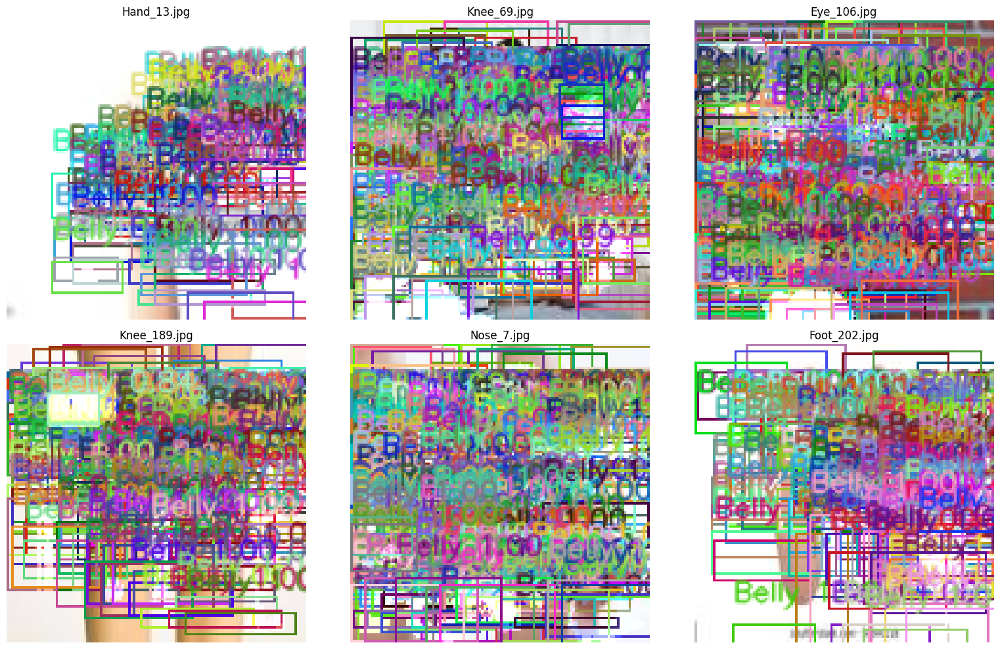

In [ ]:
from ultralytics import YOLO

# Load trained segmentation model
model = YOLO("saved_models/ultra_yolo_seg.pt")

# Path to test images
test_img_dir = "/content/body_parts_seg/images/test"

# Test on random images

# Test on random validation images
test_random_segmentation_predictions(
    model,
    img_dir="/content/body_parts_seg/images/test",
    num_images=6,
    conf=0.5
)


In [ ]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_segmentation_predictions_ioufilter(
    model,
    img_dir,
    mask_dir=None,
    num_images=6,
    conf=0.25,
    iou_thresh=0.5,
    device="cuda",
    randomize=True,
    seed=42
):
    """
    Visualize YOLO segmentation predictions with IoU-based label filtering.

    Args:
        model: YOLO segmentation model (trained or pretrained)
        img_dir (str): Directory containing test images
        mask_dir (str): Directory containing ground-truth masks (optional)
        num_images (int): Number of images to display
        conf (float): Confidence threshold for predictions
        iou_thresh (float): IoU threshold to display labels/bounding boxes
        device (str): 'cuda' or 'cpu'
        randomize (bool): If True, select random subset of images
        seed (int): Random seed for reproducibility
    """

    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
    if not img_paths:
        print(f"❌ No images found in {img_dir}")
        return

    # Set random seed
    random.seed(seed)

    # Choose images
    if randomize:
        selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))
    else:
        selected_imgs = img_paths[:num_images]

    # Run model inference
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=False,
        verbose=False
    )

    # Plot setup
    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]

        # Load GT mask if available
        gt_mask = None
        if mask_dir:
            base = os.path.splitext(os.path.basename(path))[0]
            for ext in [".png", ".jpg", ".jpeg"]:
                p = os.path.join(mask_dir, base + ext)
                if os.path.exists(p):
                    gt_mask = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
                    gt_mask = cv2.resize(gt_mask, (W, H))
                    break

        base_thickness = max(1, int(min(W, H) / 500))
        base_font_scale = max(0.4, min(min(W, H) / 800.0, 1.2))

        if hasattr(res, "masks") and res.masks is not None:
            for mask, box, cls_id, conf_score in zip(
                res.masks.data, res.boxes.xyxy, res.boxes.cls, res.boxes.conf
            ):
                mask = mask.cpu().numpy()
                mask_resized = cv2.resize(mask, (W, H))
                pred_bin = (mask_resized > 0.5).astype(np.uint8)

                # Compute IoU (for filtering)
                if gt_mask is not None:
                    gt_bin = (gt_mask > 127).astype(np.uint8)
                    intersection = np.logical_and(gt_bin, pred_bin).sum()
                    union = np.logical_or(gt_bin, pred_bin).sum()
                    iou = intersection / union if union > 0 else 0.0
                else:
                    iou = 1.0  # display all if no GT

                # Skip low-IoU detections
                if iou < iou_thresh:
                    continue

                color = np.random.randint(0, 255, (3,), dtype=np.uint8)
                color_mask = np.zeros_like(img, dtype=np.uint8)
                color_mask[pred_bin > 0] = color
                img = cv2.addWeighted(img, 1, color_mask, 0.5, 0)

                x1, y1, x2, y2 = map(int, box.cpu().numpy())
                label = f"{res.names[int(cls_id)]} {float(conf_score):.2f}"
                cv2.rectangle(img, (x1, y1), (x2, y2), color.tolist(), base_thickness)
                cv2.putText(
                    img, label, (x1, max(20, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, base_font_scale,
                    color.tolist(), base_thickness, cv2.LINE_AA
                )

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(os.path.basename(path))
        ax.axis("off")

    plt.tight_layout()
    plt.show()


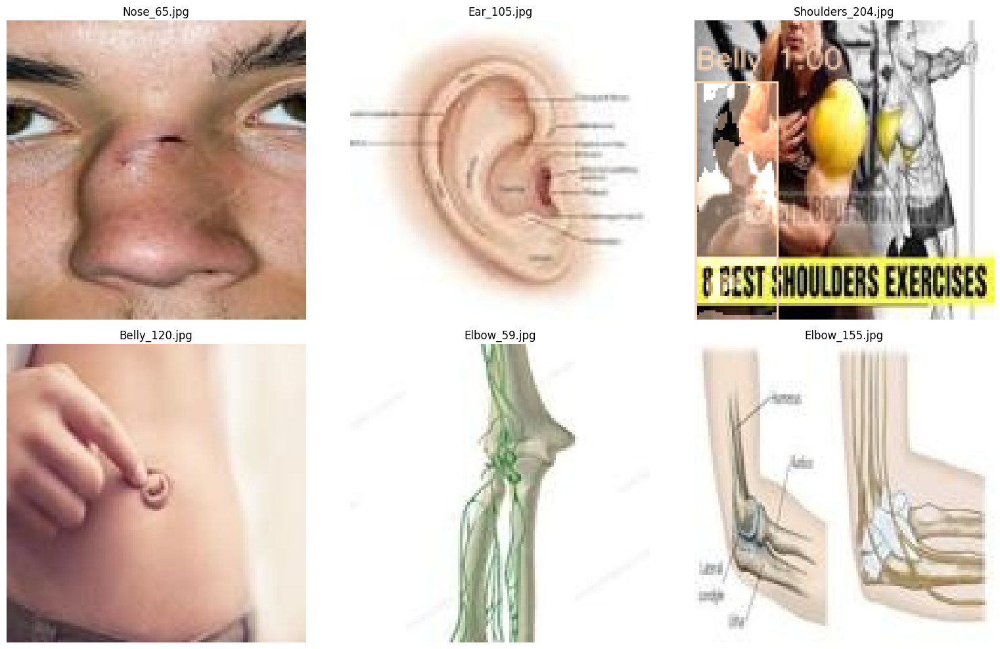

In [ ]:
from ultralytics import YOLO

# Load trained segmentation model
# model = YOLO("runs/segment/train/weights/best.pt")
model = YOLO("saved_models/ultra_yolo_seg.pt")

test_segmentation_predictions_ioufilter(
    model,
    img_dir="/content/body_parts_seg/images/test",
    mask_dir="/content/body_parts_seg/masks/test",
    num_images=6,
    conf=0.3,
    iou_thresh=0.25,
    randomize=True,   # ✅ random sampling
    seed=123          # ✅ reproducible results
)
